# ***Rice Image Classification Using Computer Vision***

---

## ***Introduction***


---

By [Darly Guntur Darris Purba](https://github.com/DarlyP)

![Data Science](https://storage.googleapis.com/kaggle-datasets-images/2049052/3399185/7b6d21bb13197d412ca73fa90a143395/dataset-cover.jpg?t=2022-04-03-02-16-40)

Link Data : [Rice Image Dataset](https://www.kaggle.com/datasets/muratkokludataset/rice-image-dataset)

Link Deployment : [HuggingFace](https://huggingface.co/spaces/darly9991/Rice_Image_Classification)

---


## **Objektif**

---

Tujuan utama dari proyek ini adalah untuk mengembangkan model machine learning yang dapat secara akurat mengklasifikasikan kualitas dan jenis beras berdasarkan karakteristik visual seperti bentuk dan warna. Dengan memanfaatkan teknik pengolahan citra dan algoritma klasifikasi, proyek ini bertujuan untuk menghasilkan sistem yang dapat membantu dalam proses penentuan kualitas beras secara otomatis dan efisien. Ini akan mencakup pembuatan dan pelatihan model menggunakan dataset gambar beras yang telah diberi label untuk tiap kelasnya, serta evaluasi kinerja model untuk memastikan akurasi dan keandalannya. Dengan demikian, proyek ini diharapkan dapat meningkatkan kecepatan dan akurasi dalam penilaian kualitas beras, yang pada gilirannya akan mengoptimalkan rantai pasokan dan meningkatkan kepuasan konsumen.

---

## **Identifikasi Masalah**

---

Kolom | Keterangan
--- | ---
What | Apa karakteristik visual beras yang akan digunakan untuk klasifikasi?
Why | Mengapa proyek ini relevan untuk diterapkan di industri pertanian dan pangan saat ini?
Who | Siapa saja yang akan mendapatkan manfaat dari hasil proyek ini?
When | Kapan sistem ini akan diuji dalam lingkungan nyata untuk memastikan kinerjanya?
Where |Di mana sistem klasifikasi ini akan diimplementasikan setelah selesai?
How |Bagaimana model machine learning akan dikembangkan, dilatih, dan dievaluasi?

---

## ***Install Libraries***

---

In [5]:
!pip install split-folders
!pip install -q pydot

## ***Import Libraries***

---

In [6]:
import cv2
import os
import pathlib
import splitfolders
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
from keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
from google.colab.patches import cv2_imshow

---

## ***Data Loading***

---

In [7]:
# Menginstall Kaggle
!pip install kaggle

# Membuat Directory Kaggle
!mkdir ~/.kaggle

# Copy kaggle.json ke dalam Directory Baru
!cp kaggle.json ~/.kaggle/

# Menggunakan Izin dari Directory
!chmod 600 ~/.kaggle/kaggle.json

cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [8]:
# Download Dataset
!kaggle datasets download -d muratkokludataset/rice-image-dataset

Dataset URL: https://www.kaggle.com/datasets/muratkokludataset/rice-image-dataset
License(s): CC0-1.0
 99% 217M/219M [00:01<00:00, 154MB/s]
100% 219M/219M [00:01<00:00, 149MB/s]


In [9]:
# Melakukan Unzip pada Data
!unzip ./rice-image-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (55).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (550).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5500).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5501).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5502).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5503).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5504).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5505).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5506).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5507).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5508).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5509).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (551).jpg  
  inflating: Rice_Image_Dataset/Karacadag/Karacadag (5510).jpg  
  inflating: Rice_Image_Dataset/Karacadag/K

In [10]:
# Menampilkan Konten di dalam Directory
!ls Rice_Image_Dataset

Arborio  Basmati  Ipsala  Jasmine  Karacadag  Rice_Citation_Request.txt


In [11]:
# Membaut Dataset Path
data = '/content/Rice_Image_Dataset'
data = pathlib.Path(data)

In [12]:
# Splitting Dataset
splitfolders.ratio(data, output='Rice_Image_Dataset', seed=42, ratio=(0.8, 0.2))

Copying files: 75000 files [00:09, 8178.60 files/s]


In [13]:
# Path Dataset Baru
data_dir = '/content/Rice_Image_Dataset'
data_dir = pathlib.Path(data_dir)

In [14]:
# Definisi Path Baru
main_path = '/content/Rice_Image_Dataset'
train_path = os.path.join(main_path, 'train')
test_path = os.path.join(main_path, 'val')

In [15]:
# Menampilkan banyak data di `train_path` dan `test_path`
def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Test Path')
check_path(test_path)
print('')

Train Path
Total Data - Ipsala : 12000
Total Data - Jasmine : 12000
Total Data - Basmati : 12000
Total Data - Karacadag : 12000
Total Data - Arborio : 12000

Test Path
Total Data - Ipsala : 3000
Total Data - Jasmine : 3000
Total Data - Basmati : 3000
Total Data - Karacadag : 3000
Total Data - Arborio : 3000



***Insight:***

Pada dataset `Rice_Image_Dataset` dapat ditemukan:

- 75.000 gambar jenis beras yang terdiri dari:
  - Arborio  
  - Basmati  
  - Ipsala  
  - Jasmine  
  - Karacadag

- Akan dibagi total data dengan rasio:
  - 80 % data train
  - 20 % data test

- Pada data gambar ini, data test diambil dari validation

- Untuk tiap jenis gambar diperoleh total gambar:
 - Data train: 12.000 gambar
 - Data test: 3.000 gambar

---

## ***Exploratory Data Analysis***

---

### **Fungsi Untuk Menampilkan EDA**

---

In [16]:
# Fungsi Untuk Memvisualisasikan 5 Gambar Pertama dari Setiap Kelas dengan Metode Random
def plot_images_random(path):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        fig = plt.figure(figsize=(20, 4))  # Disesuaikan Tinggi Untuk Satu Baris Gambar
        columns = 5
        rows = 1
        print('Kelas : ', label)
        images = os.listdir(folder_path)

        # Memastikan Setidaknya Ada 5 Gambar
        if len(images) < columns:
            print(f"Peringatan: Kurang dari {columns} gambar di folder '{label}'")
            continue

        # Pilih 5 Gambar Secara Acak dari Folder
        random_images = random.sample(images, columns)

        for index, image_name in enumerate(random_images):  # Loop melalui gambar-gambar yang dipilih secara acak
            fig.add_subplot(rows, columns, index + 1)
            image = plt.imread(os.path.join(folder_path, image_name))
            plt.imshow(image)
            plt.axis("off")

        plt.show()

In [17]:
# Fungsi Untuk Memvisualisasikan 5 Gambar Pertama dari Setiap Kelas
def plot_images(path):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        fig = plt.figure(figsize=(20, 4))  # Disesuaikan Tinggi Untuk Satu Baris Gambar
        columns = 5
        rows = 1
        print('Class : ', label)
        images = os.listdir(folder_path)

        # Memastikan Setidaknya Ada 5 Gambar
        if len(images) < columns:
            print(f"Warning: Less than {columns} images in folder '{label}'")
            continue

        for index in range(columns):  # Menggunakan 'columns' Dibandingkan 'columns*rows'
            fig.add_subplot(rows, columns, index + 1)
            image = plt.imread(os.path.join(folder_path, images[index]))
            plt.imshow(image)
            plt.axis("off")

        plt.show()

In [18]:
# Fungsi Untuk Menghitung dan Menampilkan Dominasi Warna
def plot_color_dominance(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]  # Ambil Beberapa Gambar Pertama
        print(f'Class: {label}')

        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            print(f'Analyzing image: {image_path}')

            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Menghitung Histogram Untuk Setiap Kanal Warna
            chans = cv2.split(image)
            colors = ("b", "g", "r")
            plt.figure()
            plt.title(f"Color Histogram for Class {label}")
            plt.xlabel("Bins")
            plt.ylabel("# of Pixels")

            for (chan, color) in zip(chans, colors):
                hist = cv2.calcHist([chan], [0], None, [256], [0, 256])
                plt.plot(hist, color=color)
                plt.xlim([0, 256])

            plt.show()

# Cara Penggunaan
# plot_color_dominance(train_path, num_images=3)

In [19]:
# Fungsi Untuk Memisahkan Dan Menampilkan Kanal Warna RGB (Color Map)
def show_rgb(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]  # Ambil beberapa gambar pertama
        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            image = cv2.imread(image_path)

            if image is None:
                print(f"Failed to load image: {image_path}")
                continue

            b = image.copy()
            b[:, :, 1] = 0
            b[:, :, 2] = 0

            g = image.copy()
            g[:, :, 0] = 0
            g[:, :, 2] = 0

            r = image.copy()
            r[:, :, 0] = 0
            r[:, :, 1] = 0

            # Plotting the images in a single row
            fig, axs = plt.subplots(1, 3, figsize=(15, 5))
            fig.suptitle(f'Color Channels for Class {label}', fontsize=16)

            axs[0].imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))
            axs[0].set_title('Blue Channel')
            axs[0].axis('off')

            axs[1].imshow(cv2.cvtColor(g, cv2.COLOR_BGR2RGB))
            axs[1].set_title('Green Channel')
            axs[1].axis('off')

            axs[2].imshow(cv2.cvtColor(r, cv2.COLOR_BGR2RGB))
            axs[2].set_title('Red Channel')
            axs[2].axis('off')

            plt.show()

In [20]:
# Fungsi Untuk Memisahkan Dan Menampilkan Kanal Warna RGB (Color Map Gray)
def show_color_channels_rgb(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]  # Ambil Beberapa Gambar Pertama
        print(f'Class: {label}')

        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            print(f'Analyzing image: {image_path}')

            image = cv2.imread(image_path)
            chans = cv2.split(image)

            colors = ("Blue Channel", "Green Channel", "Red Channel")
            plt.figure(figsize=(15, 5))
            plt.suptitle(f"Color Channels for Class {label}")

            for i, (chan, color) in enumerate(zip(chans, colors)):
                plt.subplot(1, 3, i + 1)
                plt.imshow(chan, cmap='gray')
                plt.title(color)
                plt.axis('off')

            plt.show()

# Fungsi Untuk Mengonversi Rgb Ke CMYK
def rgb_to_cmyk(image):
    image = image.astype('float') / 255.0
    K = 1 - np.max(image, axis=2)
    C = (1 - image[..., 0] - K) / (1 - K + 1e-10)
    M = (1 - image[..., 1] - K) / (1 - K + 1e-10)
    Y = (1 - image[..., 2] - K) / (1 - K + 1e-10)
    CMYK = (C, M, Y, K)
    return CMYK

# Fungsi Untuk Memisahkan dan Menampilkan Kanal Warna CYMK
def show_color_channels_cymk(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]  # Ambil Beberapa Gambar Pertama
        print(f'Class: {label}')

        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            print(f'Analyzing image: {image_path}')

            image = cv2.imread(image_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            C, M, Y, K = rgb_to_cmyk(image_rgb)

            total_pixels = image.shape[0] * image.shape[1]

            colors = ("Cyan", "Magenta", "Yellow", "Black")
            CMYK_channels = (C, M, Y, K)
            plt.figure(figsize=(20, 5))
            plt.suptitle(f"Color Channels for Class {label}")

            for i, (chan, color) in enumerate(zip(CMYK_channels, colors)):
                plt.subplot(1, 4, i + 1)
                plt.imshow(chan, cmap='gray')
                plt.title(f"{color} ({np.sum(chan)/total_pixels*100:.2f}%)")
                plt.axis('off')

            plt.show()


# Cara Penggunaan
# show_color_channels_cymk(train_path, num_images=3)
# show_color_channels_rgb(train_path, num_images=3)

In [21]:
# Fungsi Untuk Mendeteksi dan Menampilkan Tepi
def show_edges(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]  # Ambil Beberapa Gambar Pertama
        print(f'Class: {label}')

        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            print(f'Analyzing image: {image_path}')

            image = cv2.imread(image_path)
            image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Menggunakan Canny Edge Detection
            edges = cv2.Canny(image_gray, 100, 200)

            plt.figure(figsize=(7, 5))
            plt.imshow(edges, cmap='gray')
            plt.title('Edge Detection')
            plt.axis('off')
            plt.show()

# Cara Penggunaan
# show_edges(train_path, num_images=3)

In [22]:
# Fungsi Untuk Menampilkan Sudut Tepi
def show_edge_angles(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]  # Ambil Beberapa Gambar Pertama
        print(f'Class: {label}')

        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            print(f'Analyzing image: {image_path}')

            image = cv2.imread(image_path)
            image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Menggunakan Canny Edge Detection
            edges = cv2.Canny(image_gray, 50, 150)

            #  Menggunakan Hough Line Transform Untuk Mendeteksi Garis
            lines = cv2.HoughLines(edges, 1, np.pi / 180, 100)

            if lines is not None:
                angles = []
                for rho, theta in lines[:, 0]:
                    angle = np.degrees(theta)
                    angles.append(angle)

                plt.figure(figsize=(10, 10))
                plt.hist(angles, bins=180, range=(0, 180))
                plt.title(f'Edge Angles for Class {label}')
                plt.xlabel('Angle (degrees)')
                plt.ylabel('Frequency')
                plt.show()
            else:
                print(f'No lines detected for image: {image_path}')

# Cara Penggunaan
# show_edge_angles(train_path, num_images=3)

In [23]:
# Fungsi untuk menampilkan tinggi dan berat gambar
def show_height_weight(path, num_images=3):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        images = os.listdir(folder_path)[:num_images]
        print(f'Class: {label}')

        for image_name in images:
            image_path = os.path.join(folder_path, image_name)
            print(f'Analyzing image: {image_path}')

            # Menggunakan OpenCV untuk membaca gambar
            image = cv2.imread(image_path)

            # Mengambil tinggi dan lebar gambar
            height, width, _ = image.shape

            # Menghitung berat gambar
            weight = os.path.getsize(image_path)

            print(f'Height: {height}, Width: {width}, Weight: {weight} bytes')

# Cara Penggunaan
# show_height_weight(train_path, num_images=3)


***Insight:***

Pada sesi ini, akan dibuat beberapa fungsi untuk melakukan Exploratory Data Analysis (EDA) pada dataset gambar dengan keterangan sebagai berikut:

- plot_images_random:
  - Fungsi ini akan menampilkan gambar secara acak. Tujuan dari fungsi ini adalah untuk memeriksa secara cepat apakah terdapat gambar yang mengalami kerusakan atau tidak.

- plot_images:
  - Fungsi ini akan menampilkan gambar berdasarkan path atau jalur file gambar yang diberikan.

- plot_color_dominance:
  - Fungsi ini akan menampilkan histogram distribusi intensitas warna untuk setiap channel warna RGB pada gambar.

- show_color_channels_rgb:
  - Fungsi ini akan menampilkan gambar dengan memisahkan tiap warna berdasarkan channel RGB (Merah, Hijau, Biru) menggunakan color map gray.

- show_rgb:
  - Fungsi ini akan menampilkan gambar dengan memisahkan tiap warna berdasarkan channel RGB (Merah, Hijau, Biru) menggunakan color map.


- show_color_channels_cymk:
  - Fungsi ini akan menampilkan gambar dengan memisahkan tiap warna berdasarkan channel CMYK (Cyan, Magenta, Yellow, Black) menggunakan color map gray.

- show_edges:
  - Fungsi ini akan mengonversi gambar menjadi skala abu-abu dan menggunakan algoritma *Canny Edge Detection* untuk mendeteksi dan menampilkan tepi dalam gambar.

- show_edge_angles:
  - Fungsi ini akan menggunakan transformasi *Hough* untuk mendeteksi garis pada gambar dan menghitung sudut dari garis-garis yang terdeteksi.

---

### **Menampilkan Gambar Secara Acak**

---

Kelas :  Ipsala


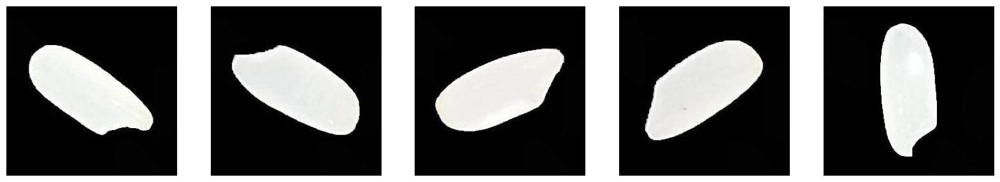

Kelas :  Jasmine


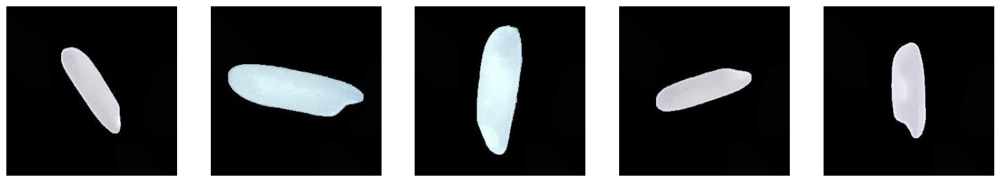

Kelas :  Basmati


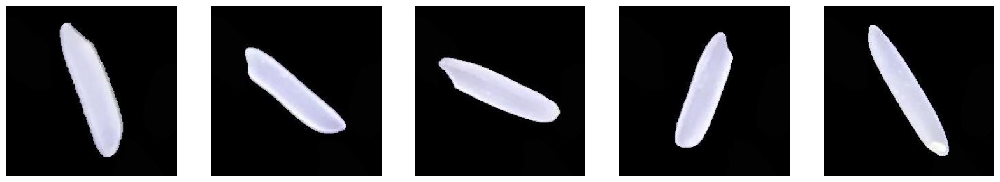

Kelas :  Karacadag


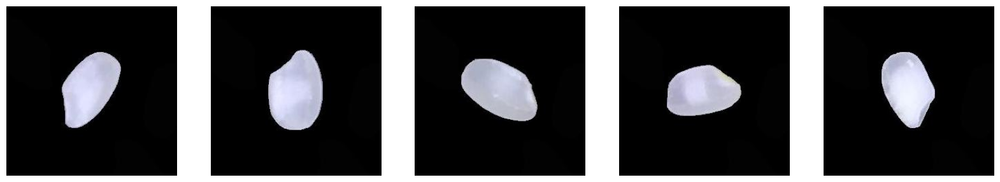

Kelas :  Arborio


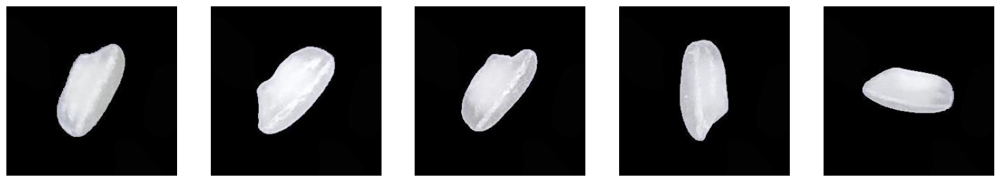

In [24]:
plot_images_random(train_path)

Kelas :  Ipsala


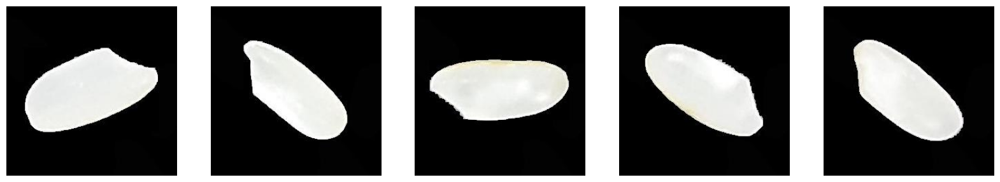

Kelas :  Jasmine


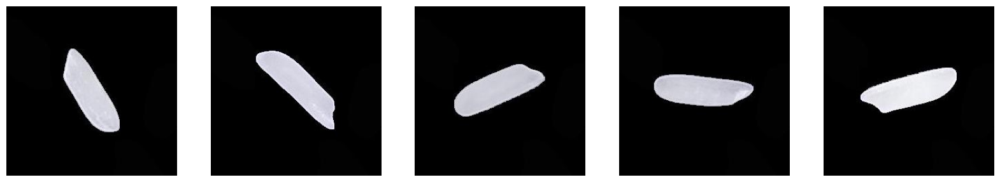

Kelas :  Basmati


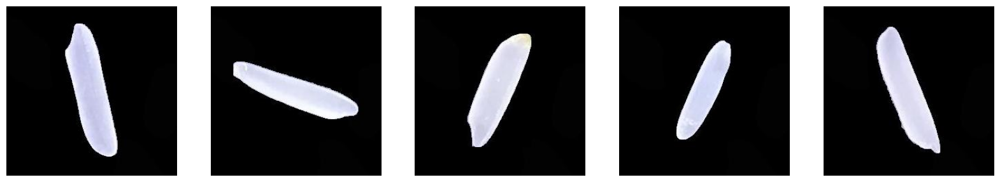

Kelas :  Karacadag


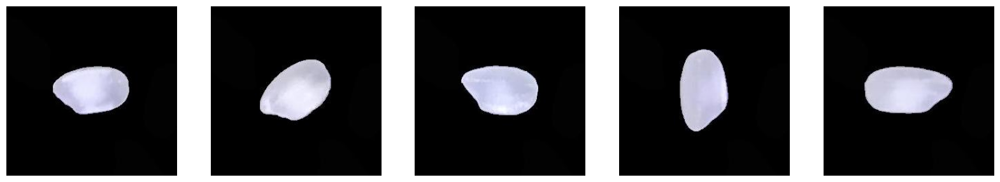

Kelas :  Arborio


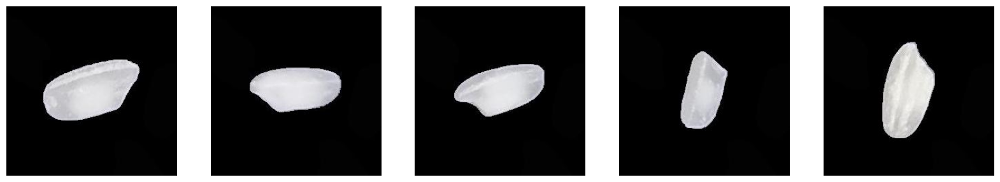

In [25]:
plot_images_random(test_path)

***Insight:***

Untuk memeriksa apakah gambar dalam dataset memiliki kecacatan atau tidak, dilakukan percobaan sebanyak 3-5 kali secara acak. Dari hasil percobaan yang dilakukan, tidak ditemukan gambar yang mengalami kecacatan. Hal ini menunjukkan bahwa dataset tersebut mungkin sudah dalam kondisi yang baik dan dapat digunakan untuk analisis lebih lanjut tanpa adanya masalah pada gambar.

---

### **Menampilkan Gambar**

---

Class :  Ipsala


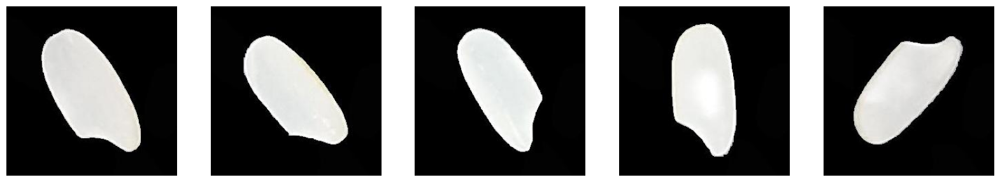

Class :  Jasmine


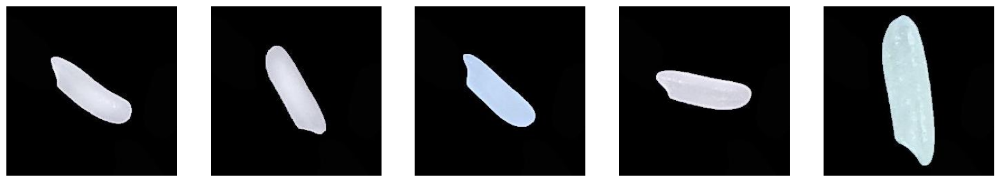

Class :  Basmati


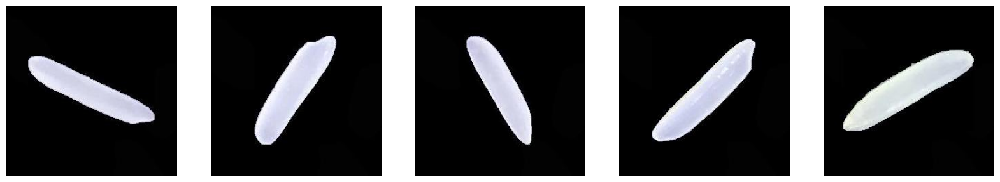

Class :  Karacadag


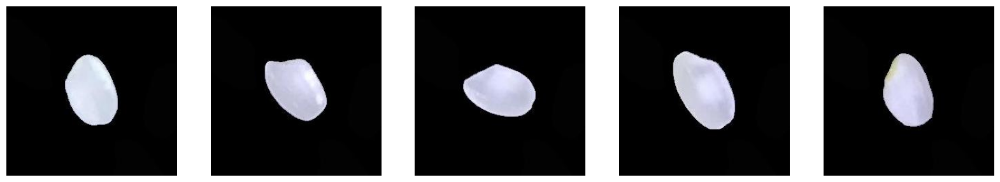

Class :  Arborio


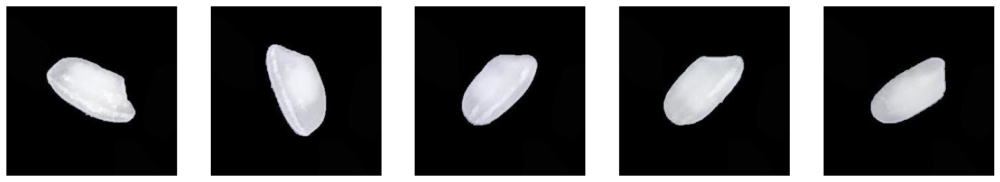

In [26]:
plot_images(train_path)

Class :  Ipsala


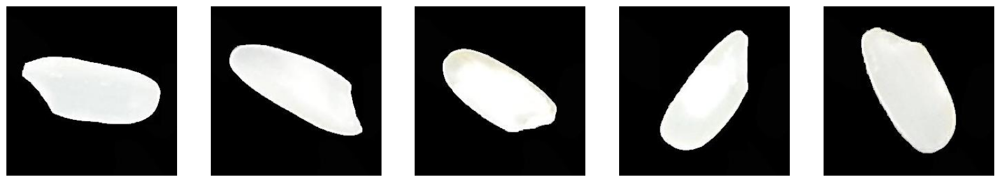

Class :  Jasmine


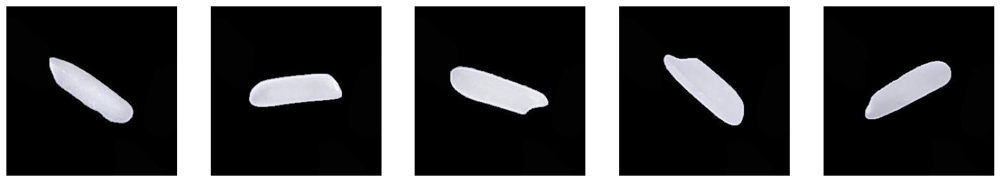

Class :  Basmati


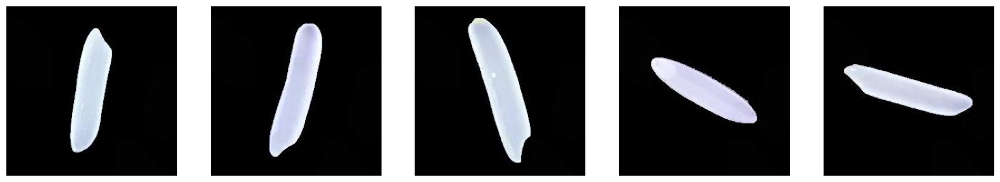

Class :  Karacadag


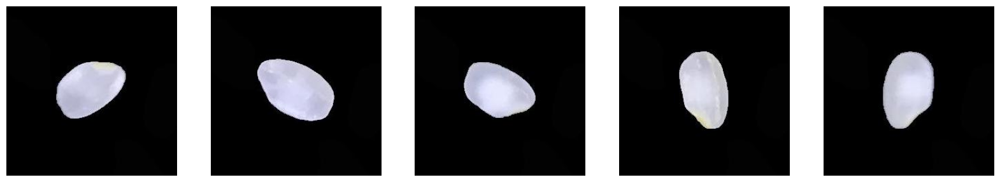

Class :  Arborio


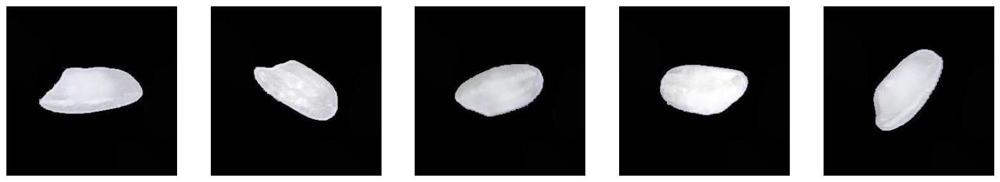

In [27]:
plot_images(test_path)

***Insight:***

Dari dataset yang ada ditampilkan gambar tiap *classnya* sebanyak 5 gambar. Untuk data train dan data test memiliki gambar yang cukup mirip dengan keterangan sebagai berikut:

- Arborio:
  - Arborio memiliki butiran berbulir pendek dan gemuk.
  - Bentuk butirannya cenderung lebih bulat dan berukuran lebih besar.

- Basmati:
  - Basmati memiliki butiran panjang dan tipis dengan ujung yang lancip.
  - Butiran basmati cenderung lebih panjang dibandingkan dengan jenis beras lainnya, dan bentuknya lebih serupa dengan biji rumput panjang.

- Ipsala:
  - Ipsala memiliki butiran berukuran sedang hingga besar.
  - Bentuk butiran Ipsala umumnya bulat atau oval dengan ukuran yang bervariasi.

- Jasmine:
  - Jasmine memiliki butiran panjang dan tipis.
  - Butiran Jasmine panjang dan ramping, serupa dengan basmati, tetapi mungkin sedikit lebih pendek dan lebih gemuk.

- Karacadag:
  - Karacadag memiliki butiran dengan tekstur yang kuat.
  - Bentuk butiran Karacadag cenderung berbentuk oval dan hampir bulat

---

 ### **Distribusi Intensitas Warna**

---

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (7437).jpg


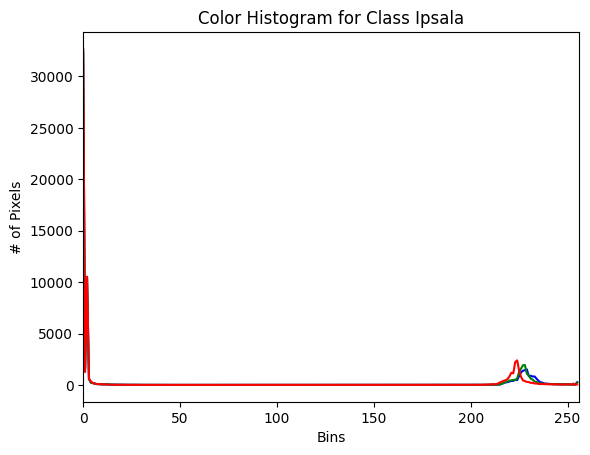

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (9998).jpg


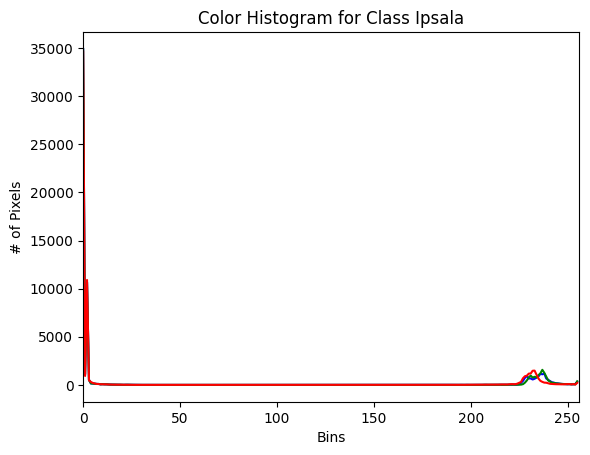

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (8570).jpg


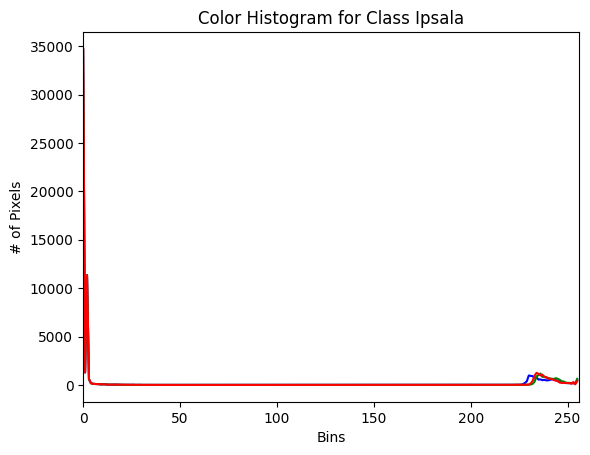

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (10946).jpg


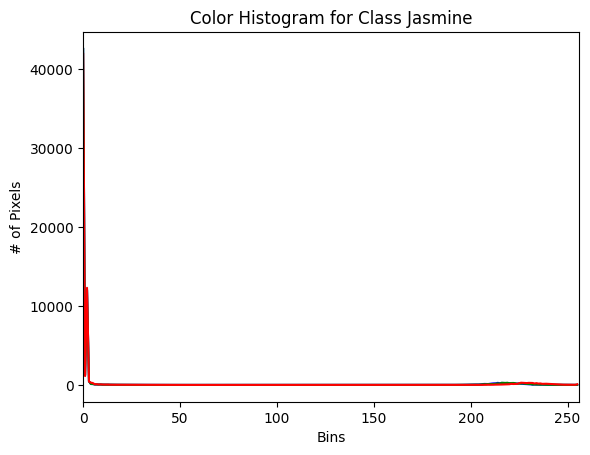

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (1941).jpg


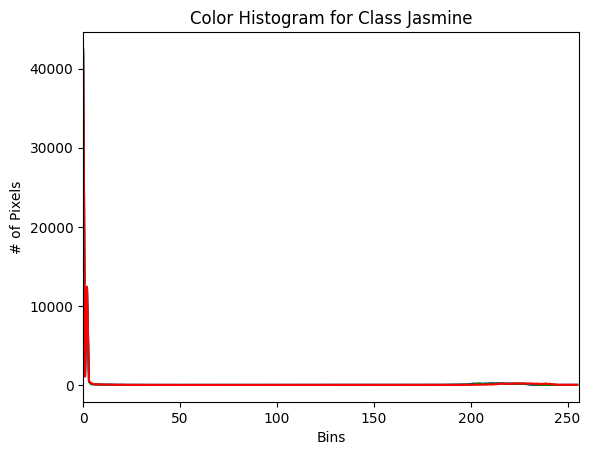

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (3391).jpg


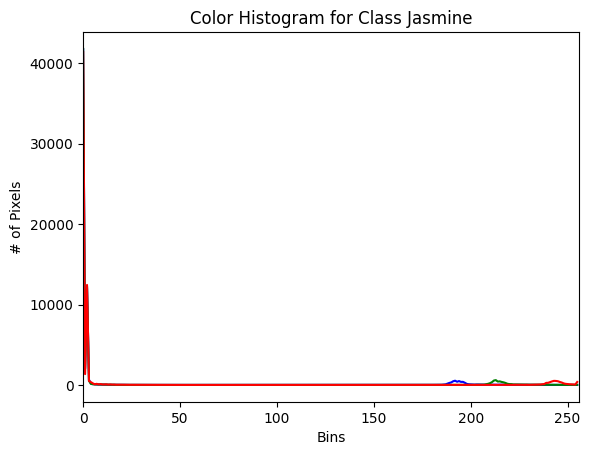

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (4950).jpg


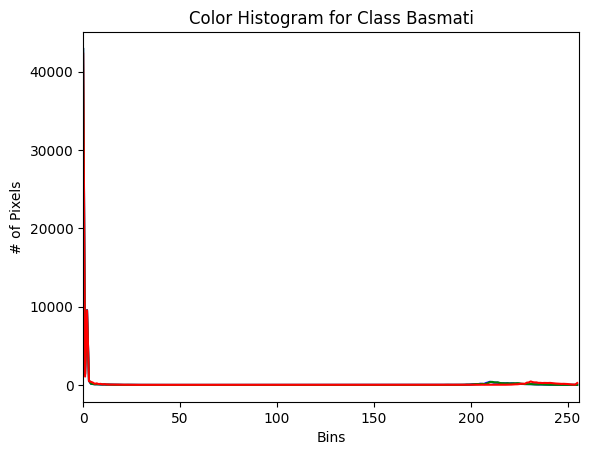

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (9451).jpg


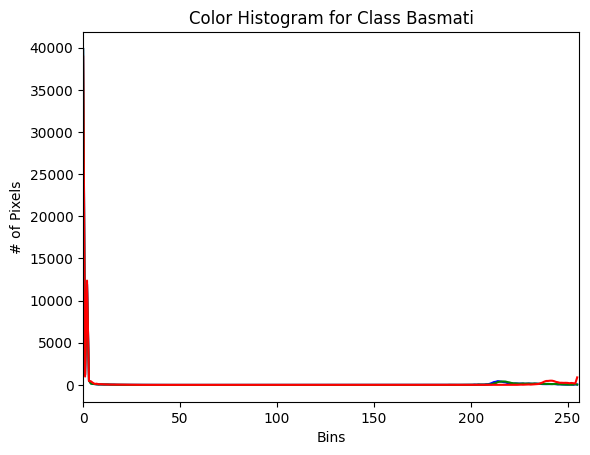

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (11).jpg


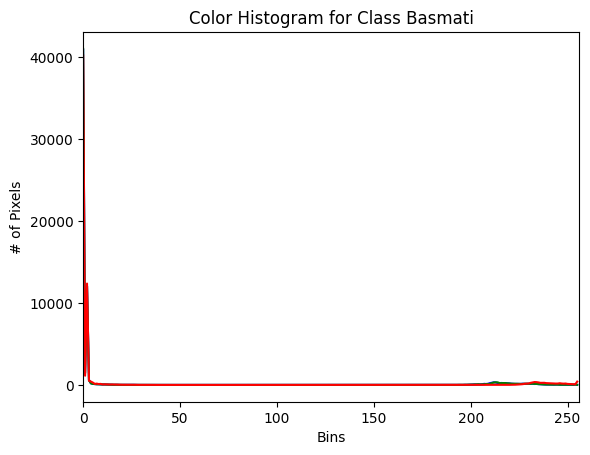

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (12509).jpg


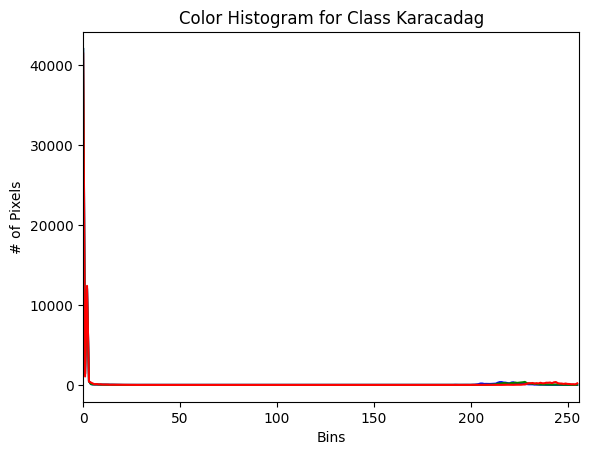

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (9923).jpg


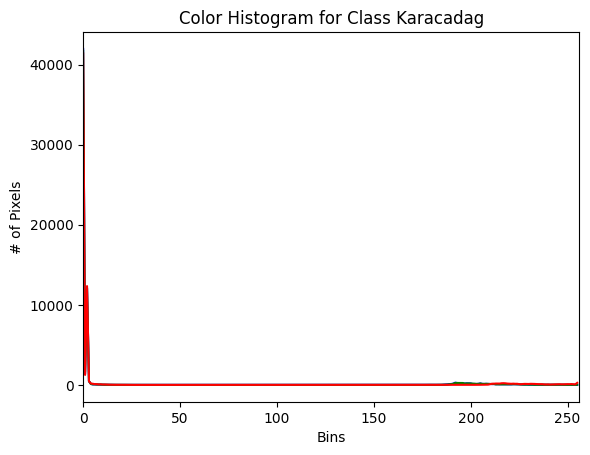

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (8753).jpg


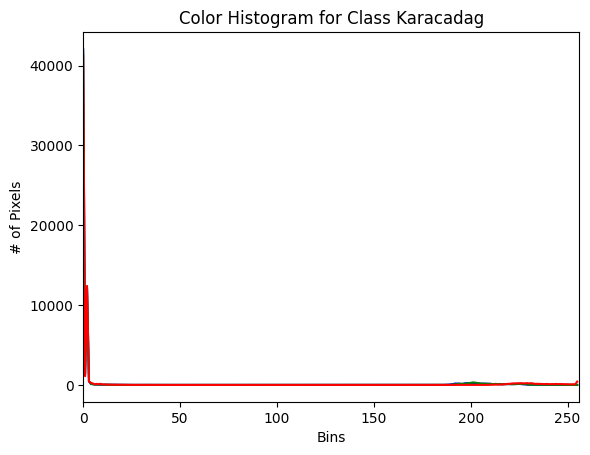

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (8398).jpg


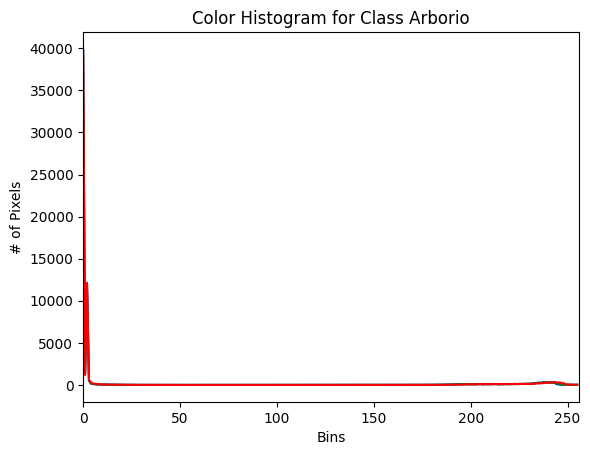

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3877).jpg


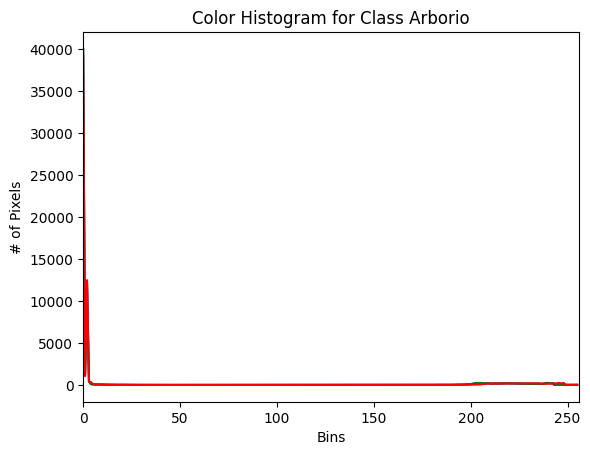

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3766).jpg


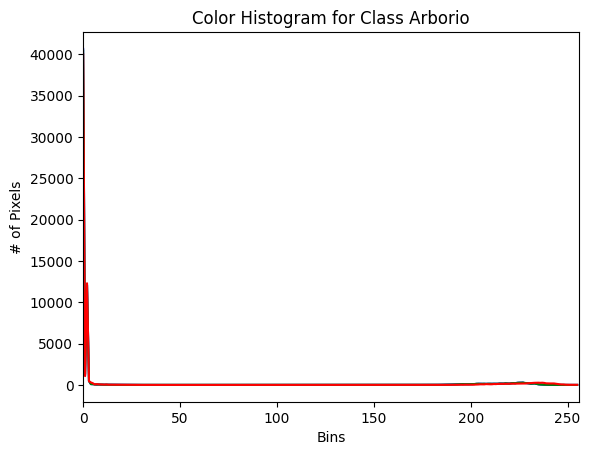

In [28]:
plot_color_dominance(train_path, num_images=3)

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (6436).jpg


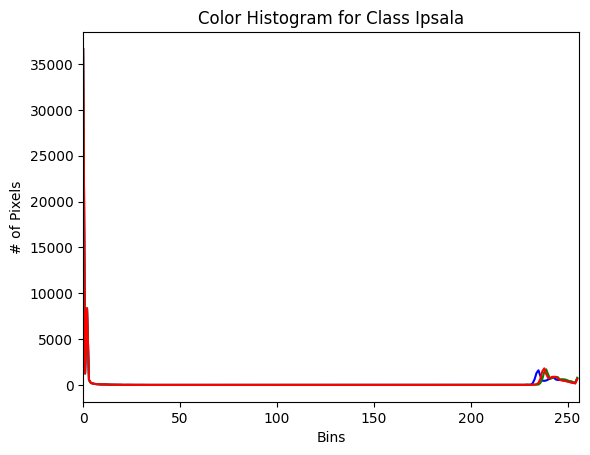

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (172).jpg


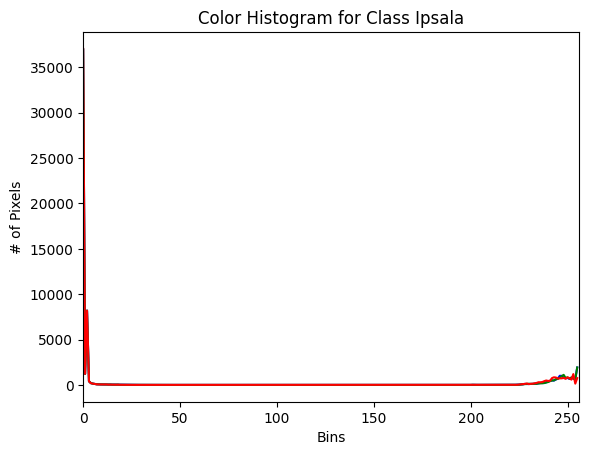

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (8674).jpg


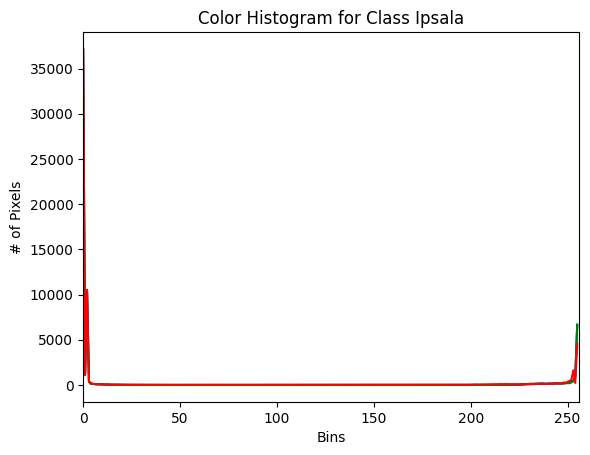

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (7745).jpg


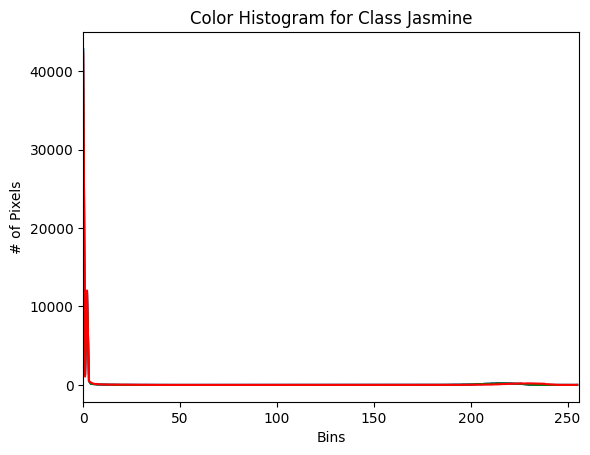

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (6104).jpg


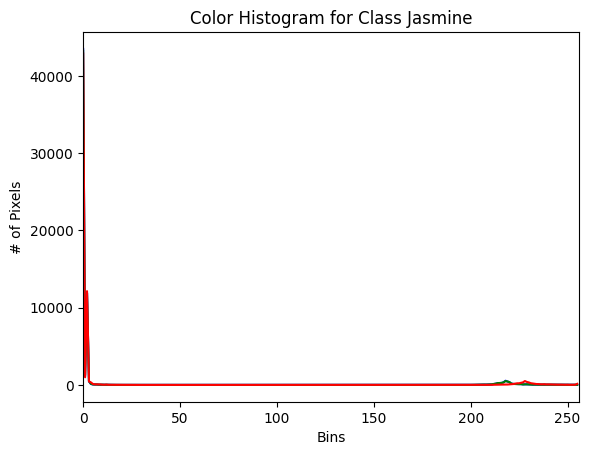

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (8464).jpg


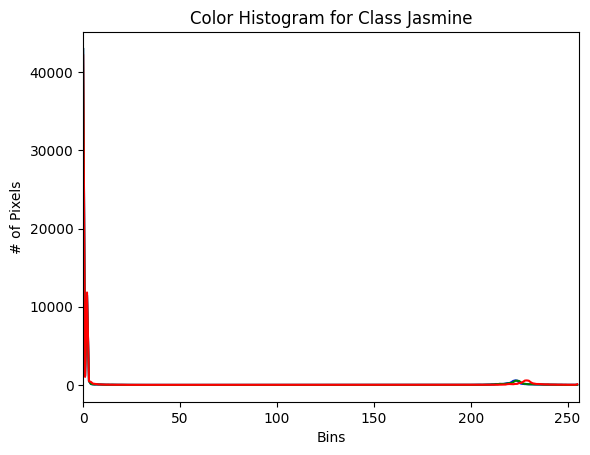

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (4253).jpg


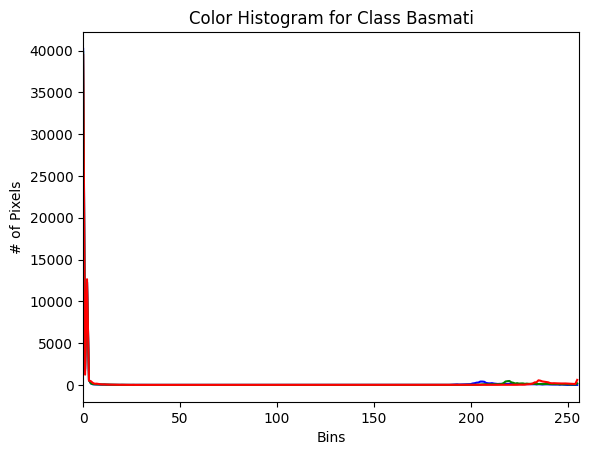

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (13061).jpg


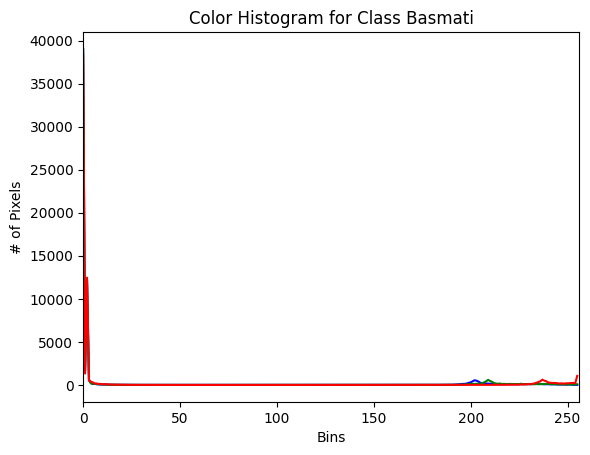

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (14585).jpg


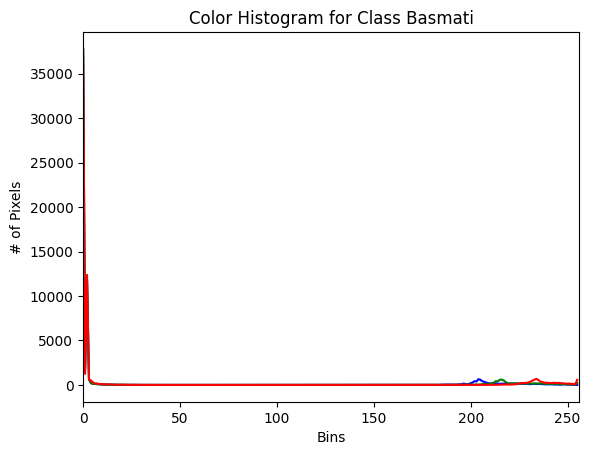

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (10715).jpg


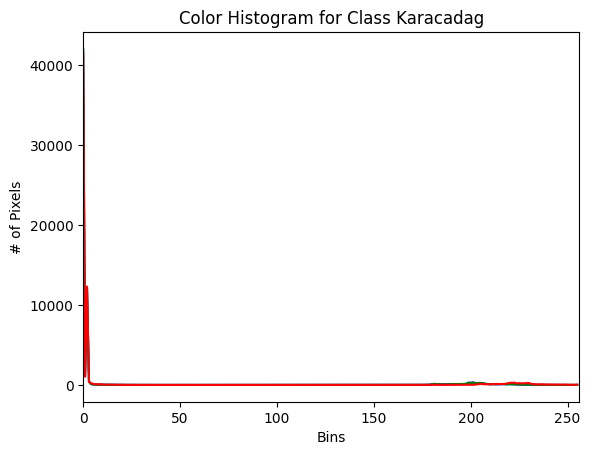

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (21).jpg


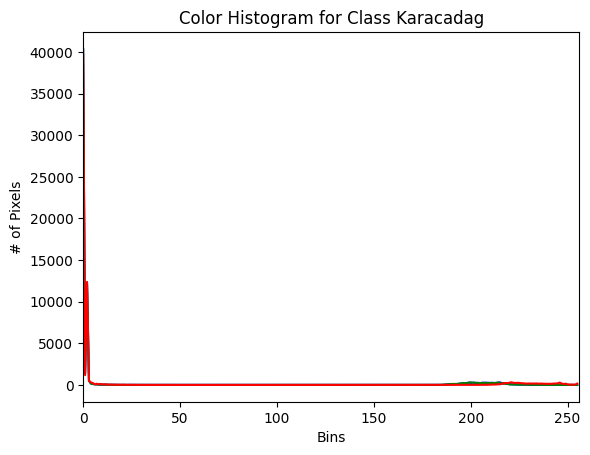

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (8484).jpg


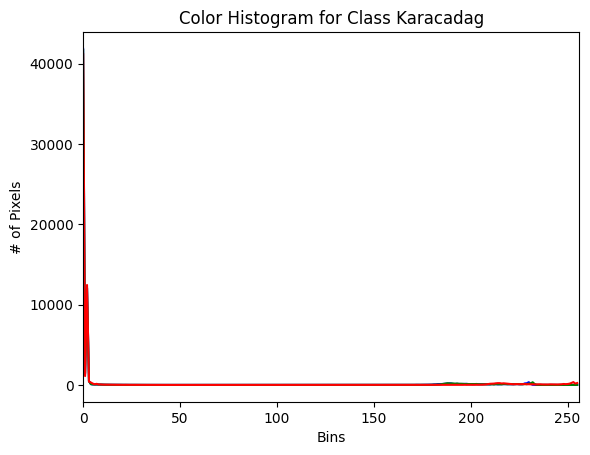

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (14843).jpg


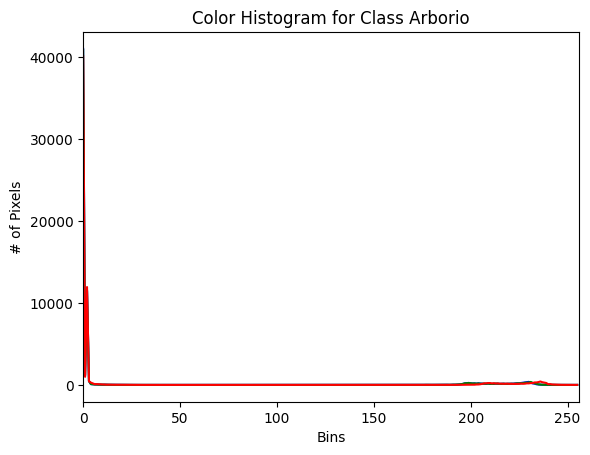

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (9029).jpg


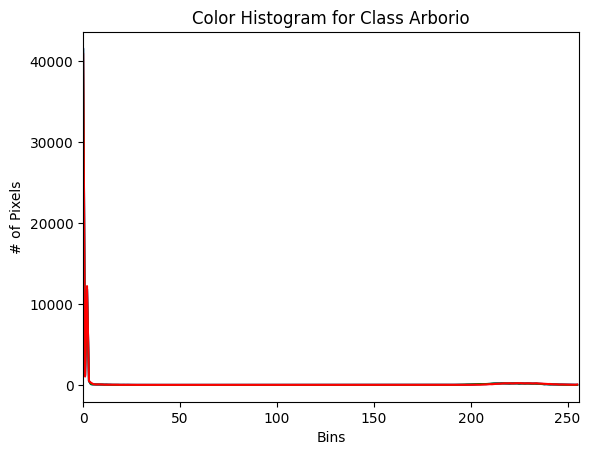

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (11430).jpg


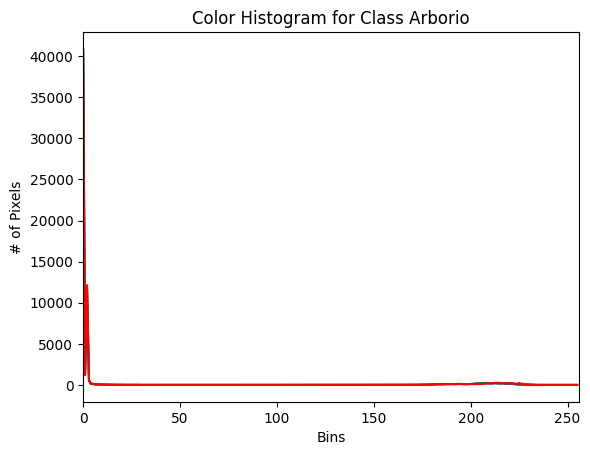

In [29]:
plot_color_dominance(test_path, num_images=3)

***Insight:***

Sesi ini akan menampilan histogram dari distribusi intensitas gambar dengan keterangan:

- Sumbu X (Bins):
  - Sumbu X menunjukkan rentang intensitas warna, dari 0 hingga 255.
  - Nilai 0 mewakili intensitas warna terendah (hitam), dan nilai 255 mewakili intensitas warna tertinggi (putih).

- Sumbu Y (# of Pixels):
  - Sumbu Y menunjukkan jumlah piksel yang memiliki intensitas tertentu.
  - Angka yang lebih tinggi di sumbu Y menunjukkan bahwa banyak piksel dalam gambar memiliki intensitas warna tertentu.

<br/>

Tiap *class* akan diwakilkan dengan 3 gambar dengan keterangan sebagai berikut:
- Gambar pertama memiliki nilai bins di sekitar angka 0, yang menandakan warna hitam, dan juga memiliki bins di sekitar angka 250 yang menandakan warna putih. Terkadang, gambar juga memiliki nilai bins di sekitar angka 230 yang menandakan warna abu-abu. Namun, nilai pixel sendiri berada di angka 0, menandakan bahwa gambar tersebut didominasi oleh warna hitam.

- Untuk setiap jenis beras, terkadang terdapat perbedaan data pada angka sekitar 190 hingga 250 bins. Hal ini menunjukkan bahwa setiap gambar beras cenderung memiliki warna abu-abu yang lebih pekat, meskipun secara pixel tidak signifikan untuk bins 0.

- Keterangan nilai bins dan pixel ini konsisten antara data train dan data test.

---

### **Gambar Channel RGB**

---

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (7437).jpg


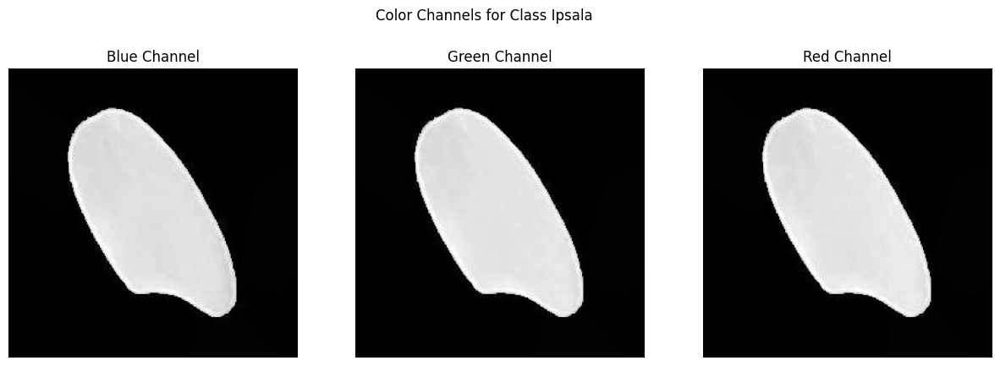

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (9998).jpg


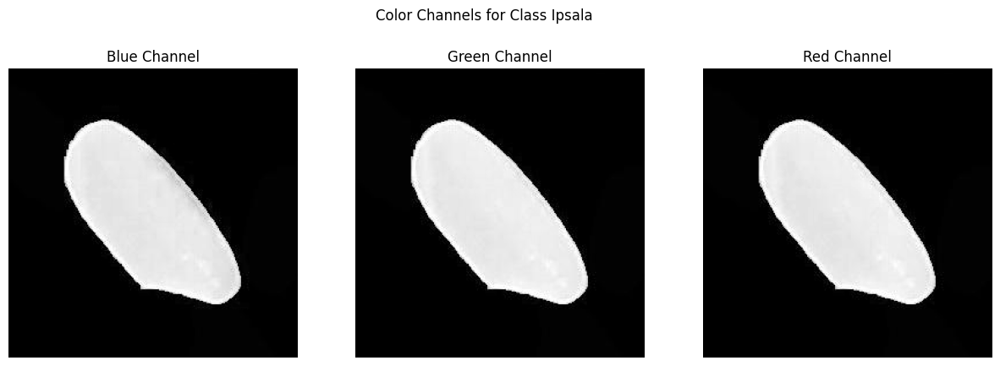

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (8570).jpg


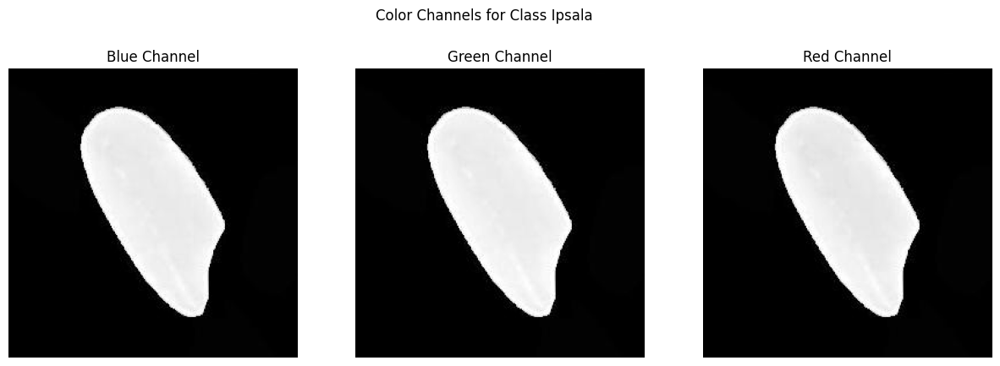

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (10946).jpg


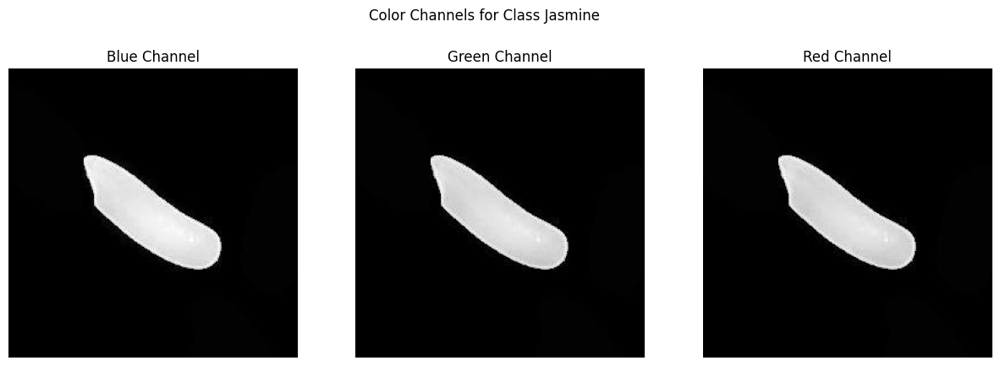

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (1941).jpg


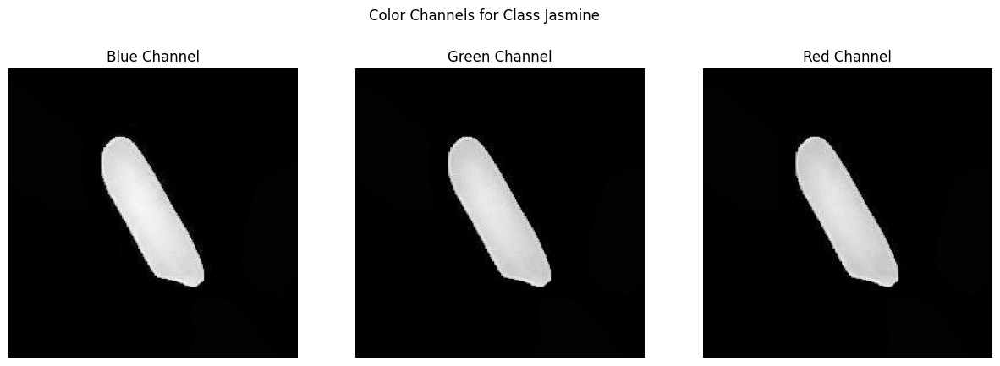

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (3391).jpg


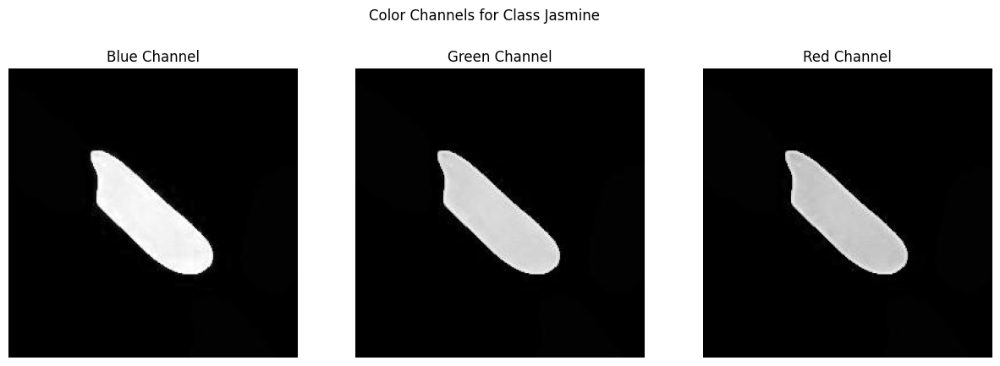

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (4950).jpg


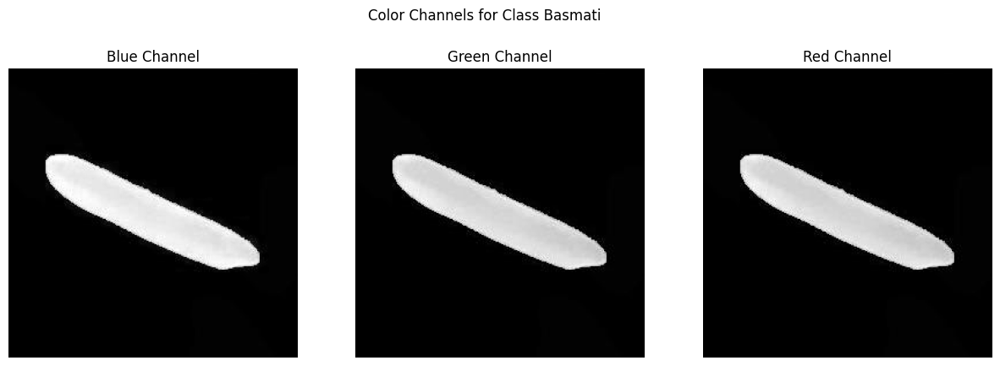

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (9451).jpg


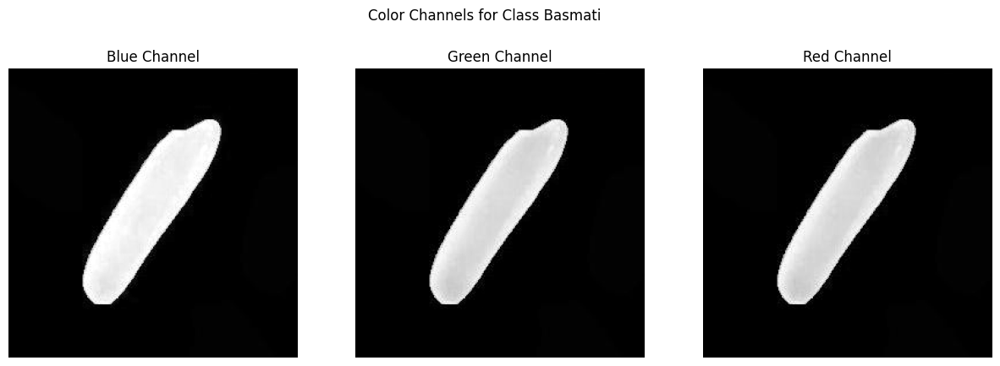

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (11).jpg


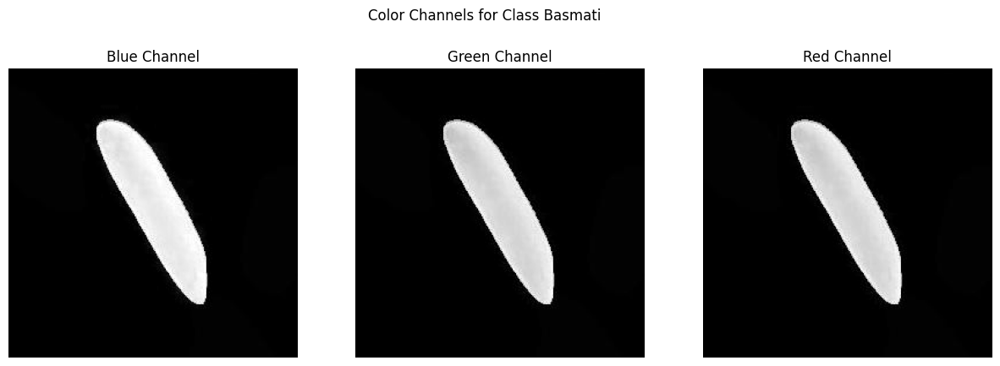

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (12509).jpg


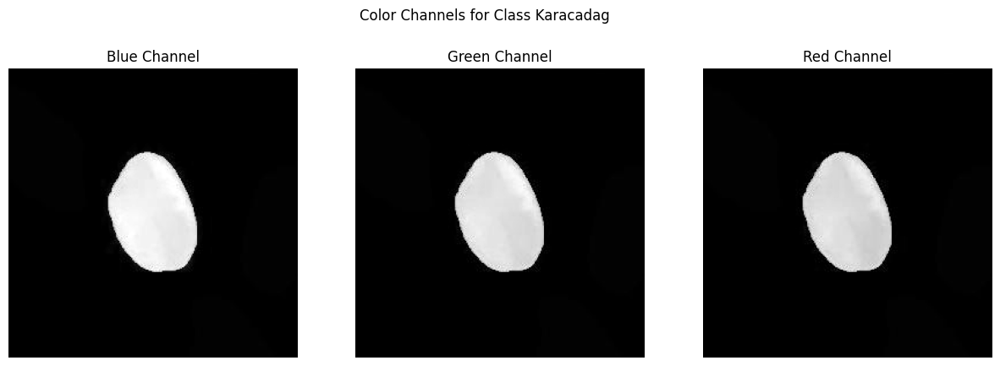

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (9923).jpg


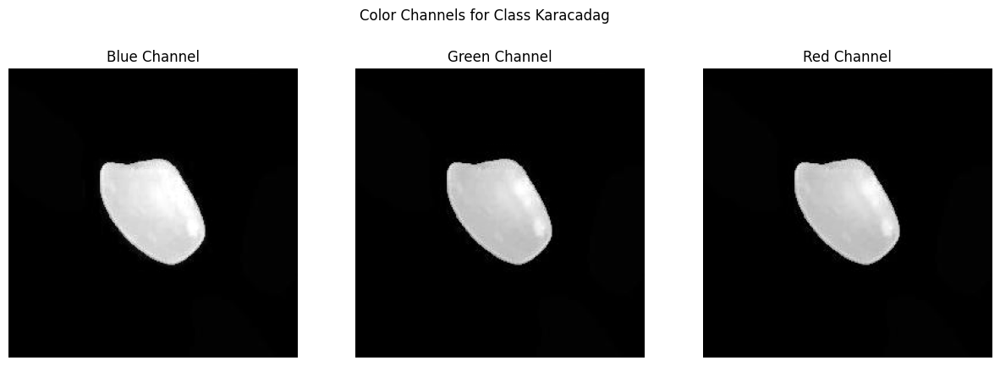

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (8753).jpg


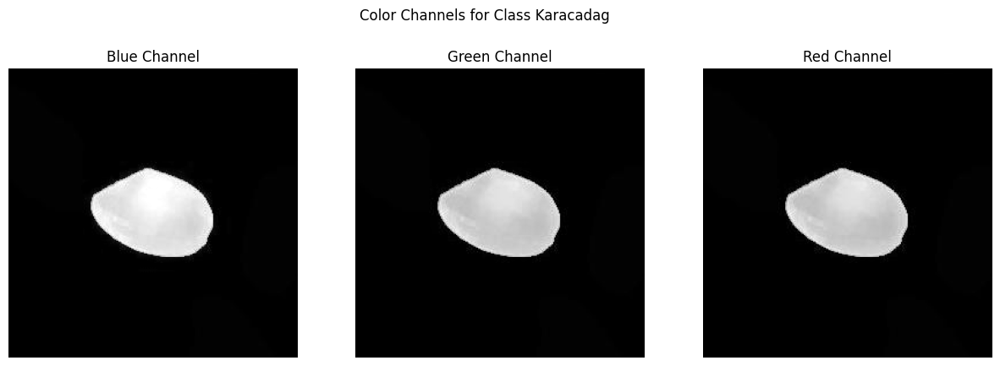

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (8398).jpg


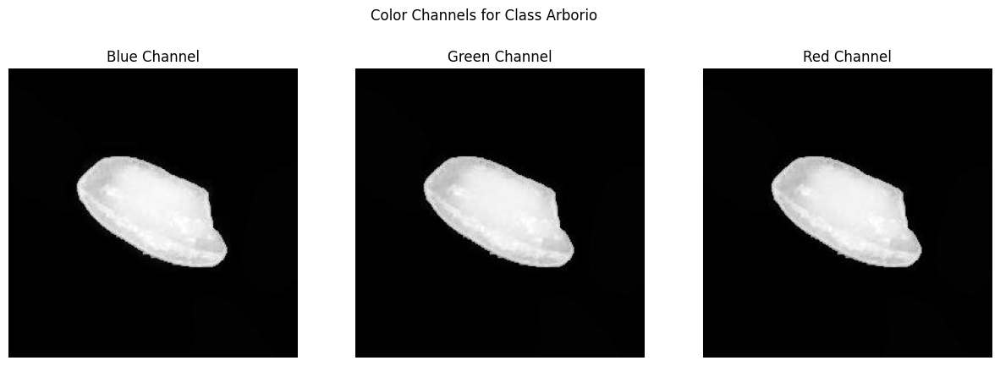

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3877).jpg


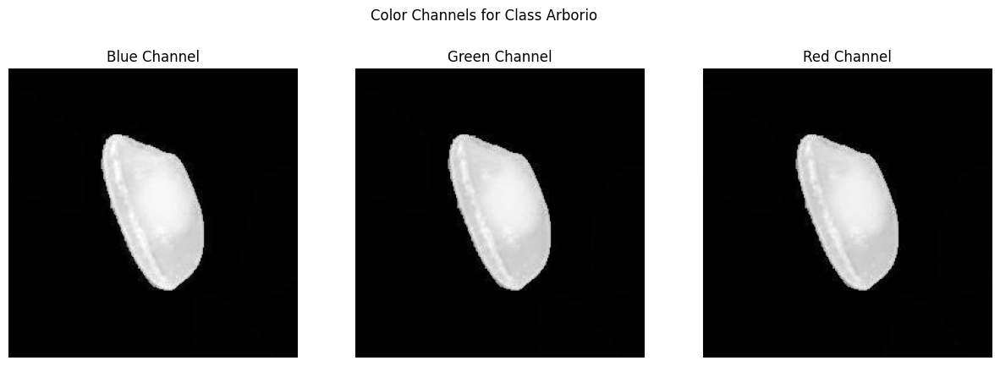

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3766).jpg


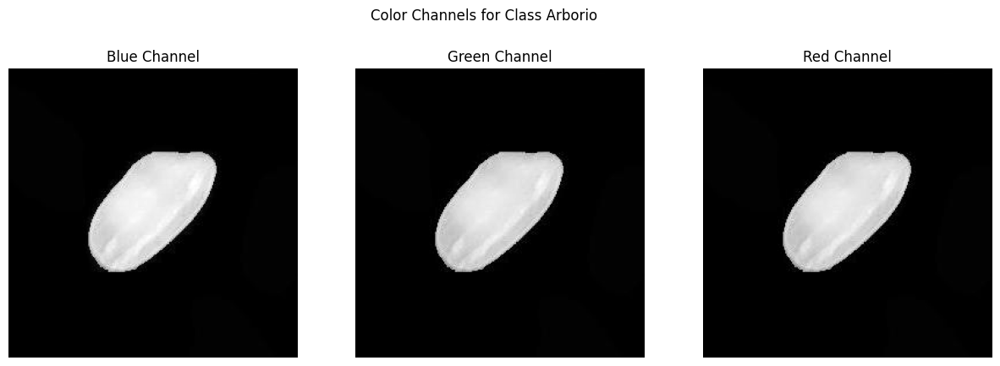

In [30]:
show_color_channels_rgb(train_path, num_images=3)

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (6436).jpg


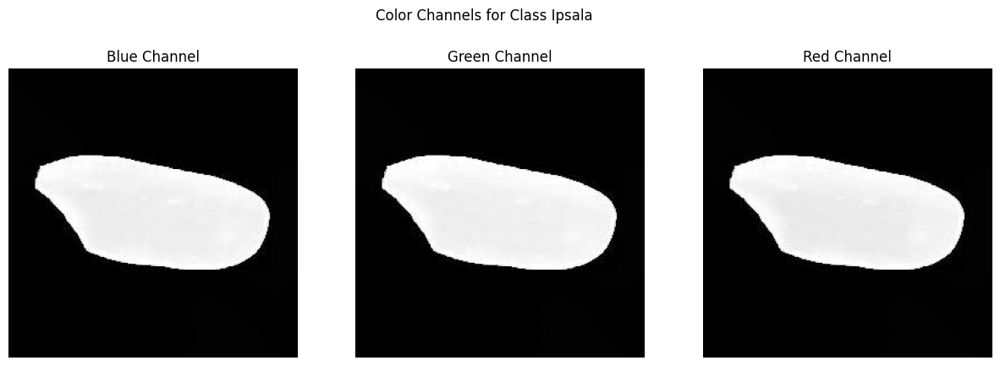

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (172).jpg


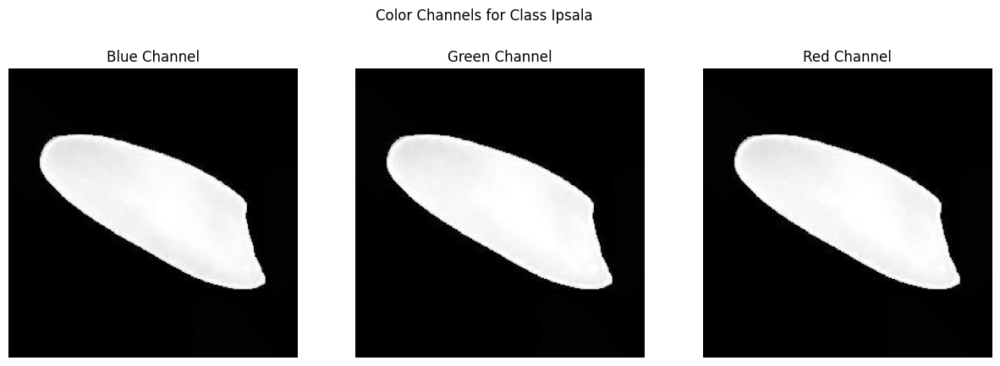

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (8674).jpg


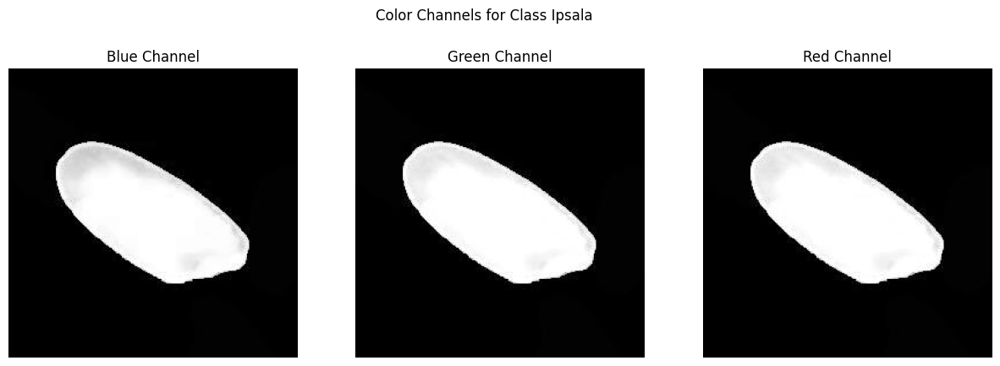

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (7745).jpg


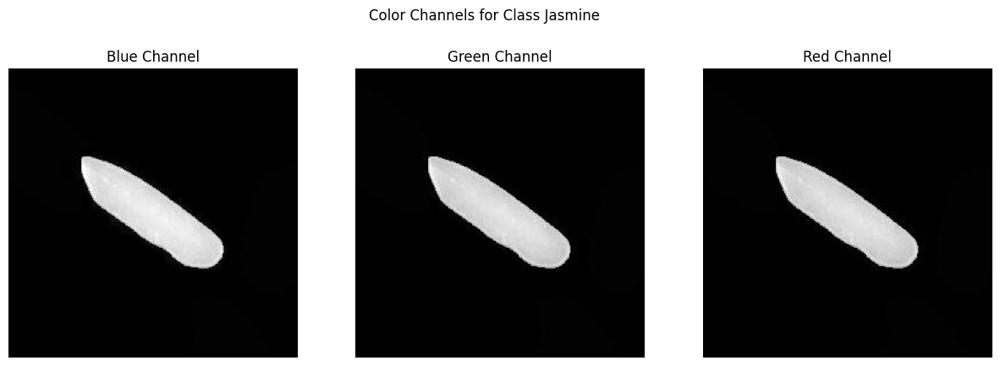

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (6104).jpg


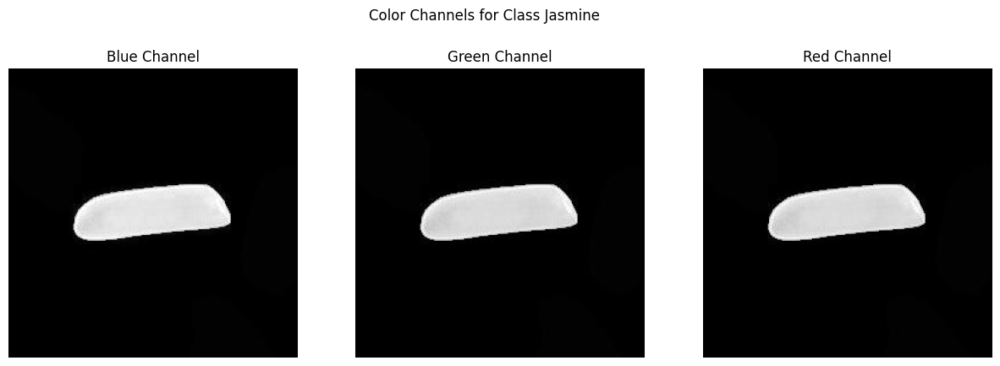

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (8464).jpg


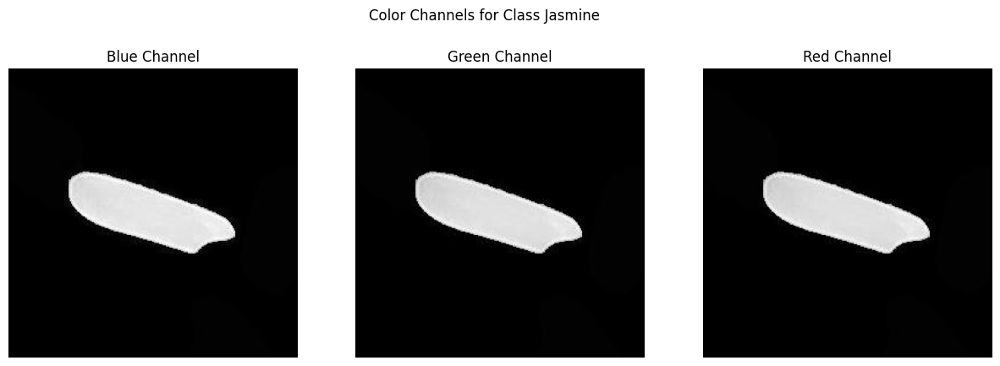

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (4253).jpg


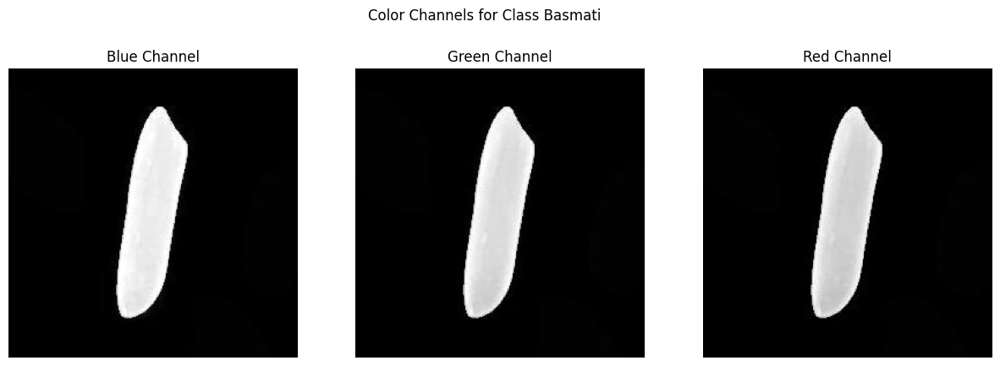

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (13061).jpg


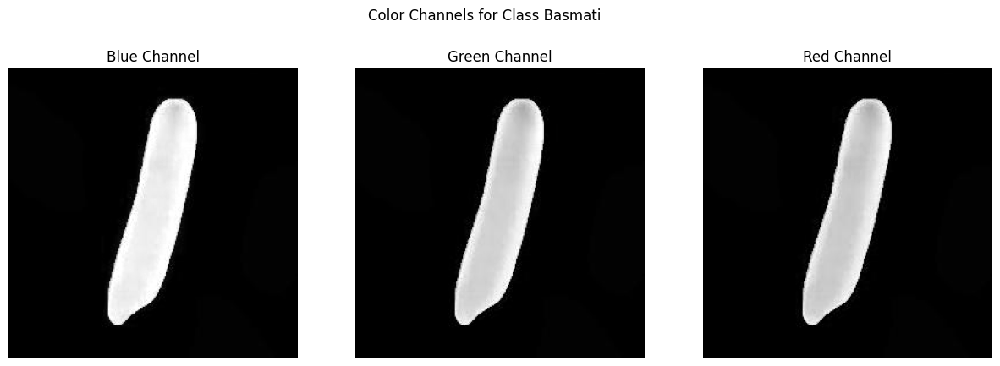

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (14585).jpg


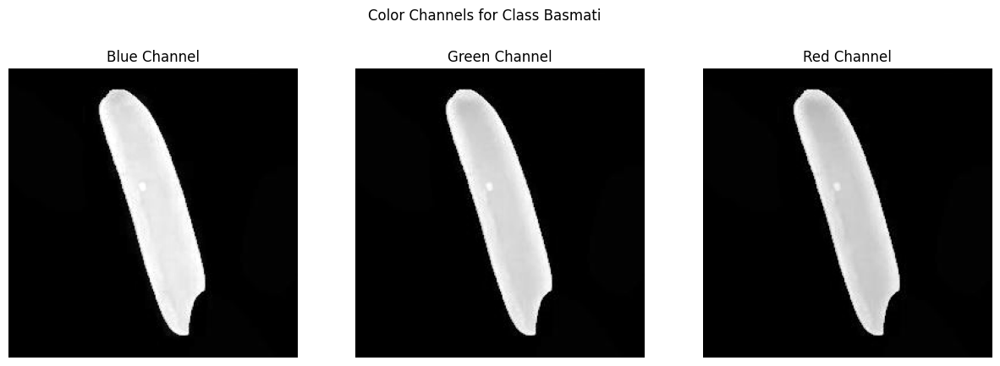

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (10715).jpg


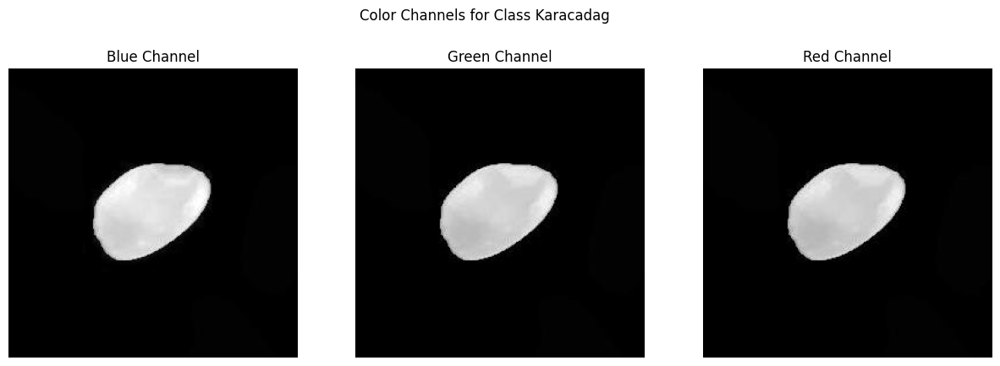

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (21).jpg


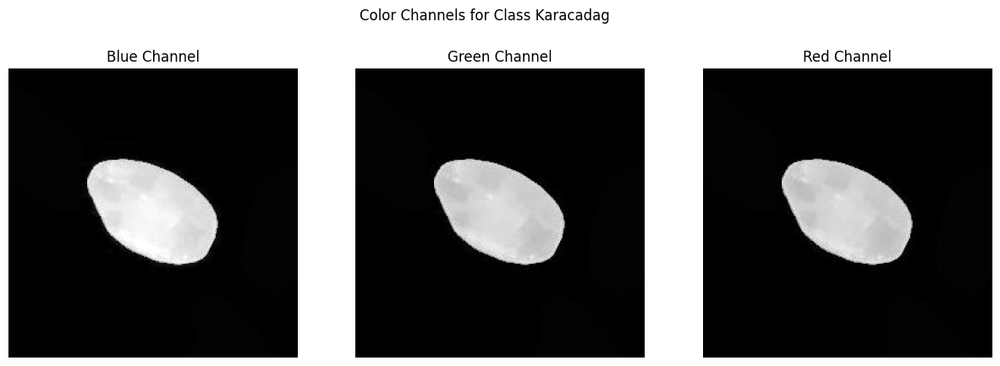

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (8484).jpg


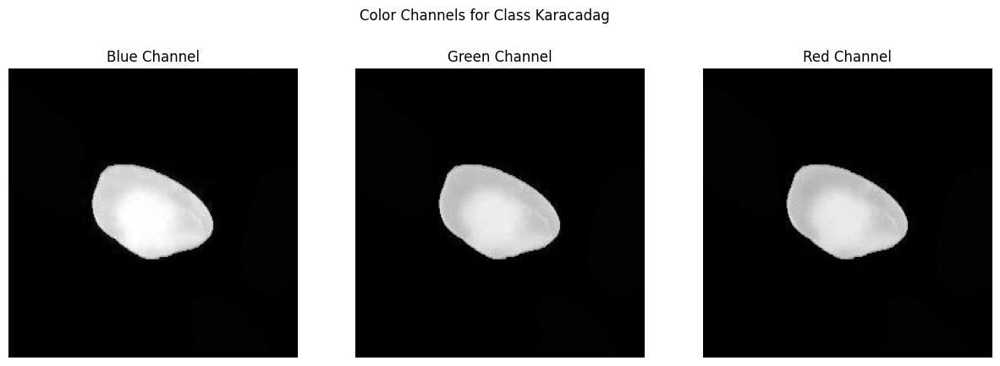

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (14843).jpg


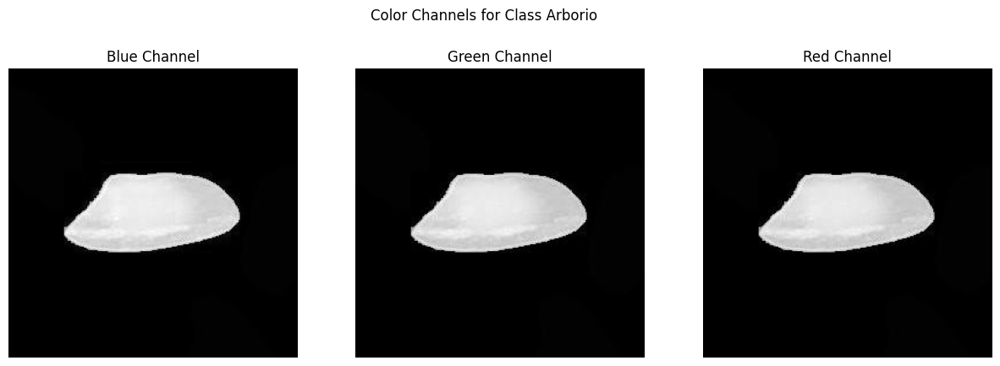

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (9029).jpg


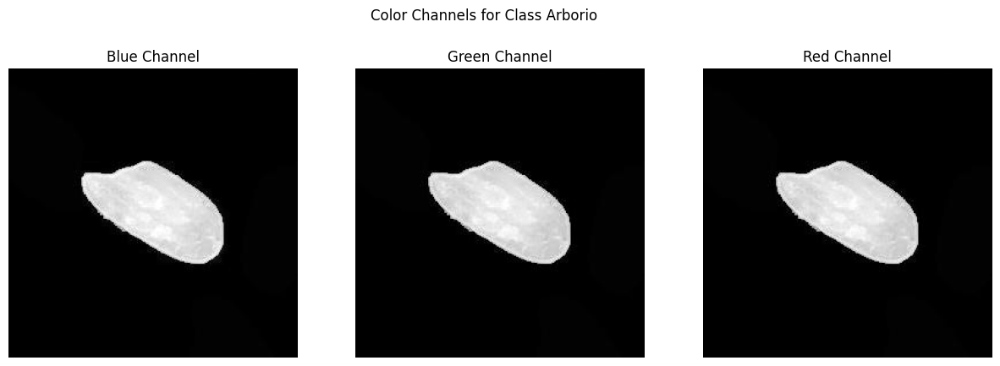

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (11430).jpg


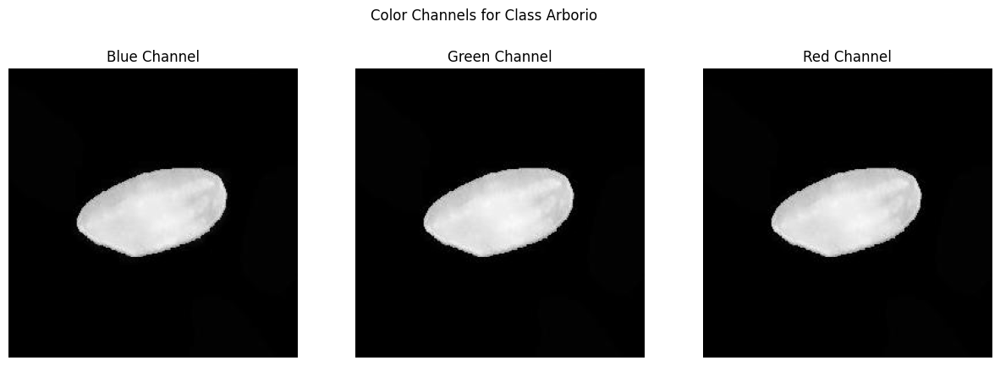

In [31]:
show_color_channels_rgb(test_path, num_images=3)

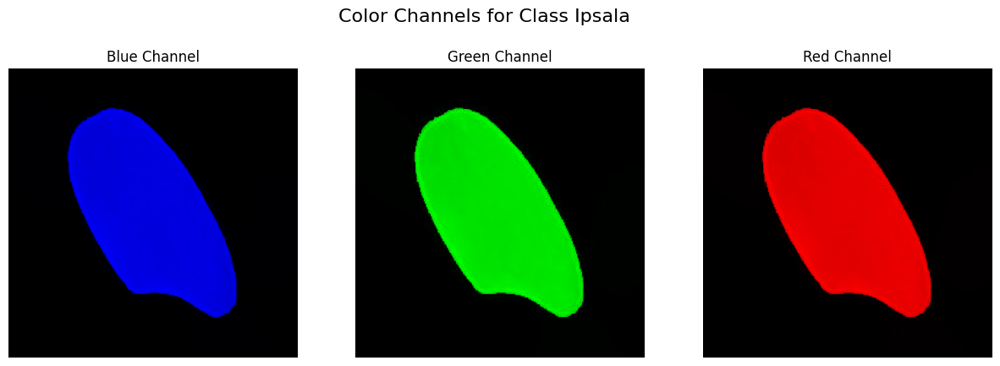

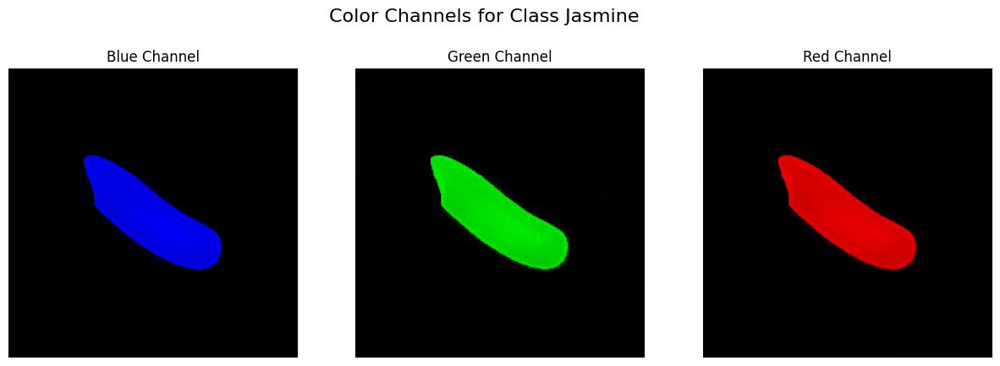

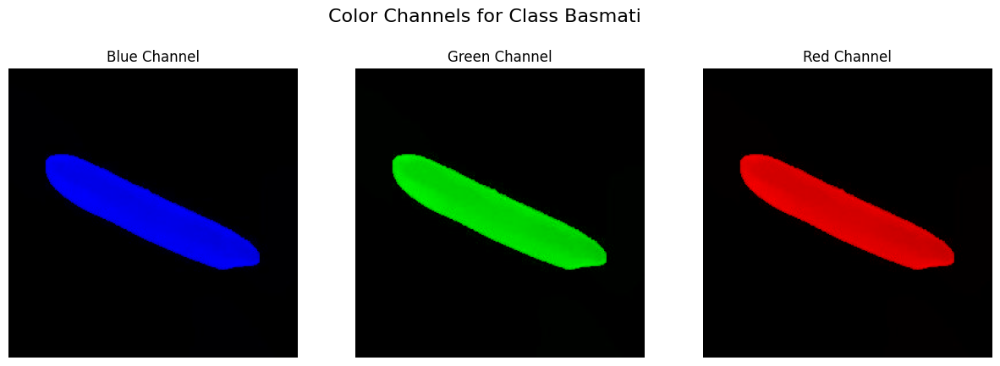

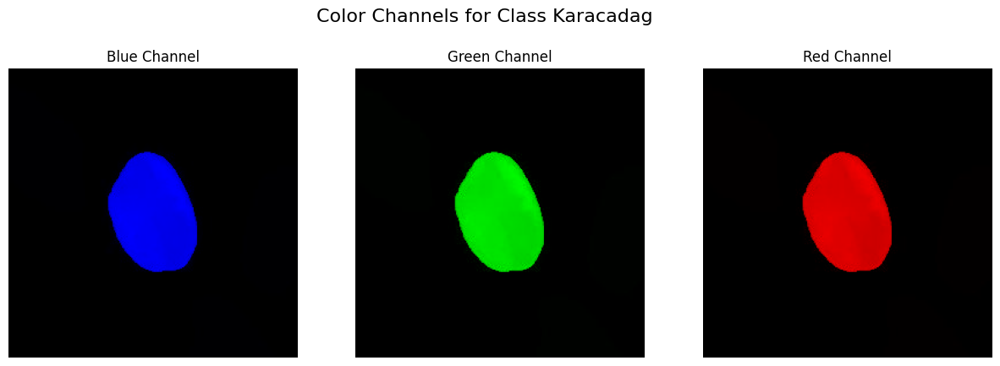

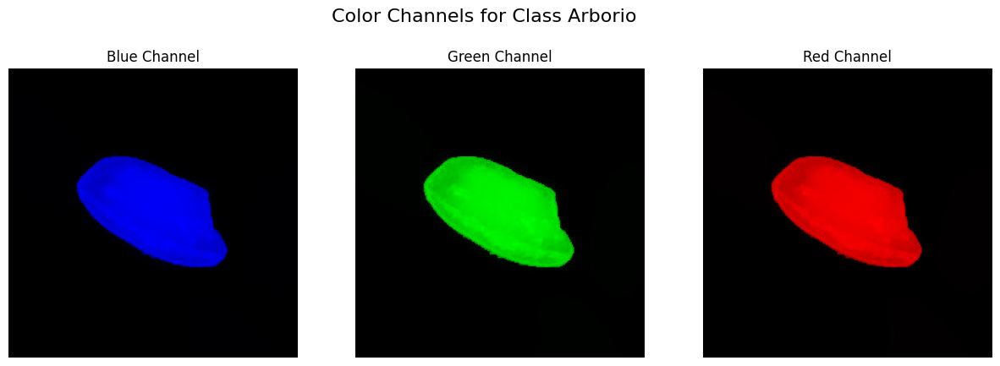

In [32]:
show_rgb(train_path, num_images=1)

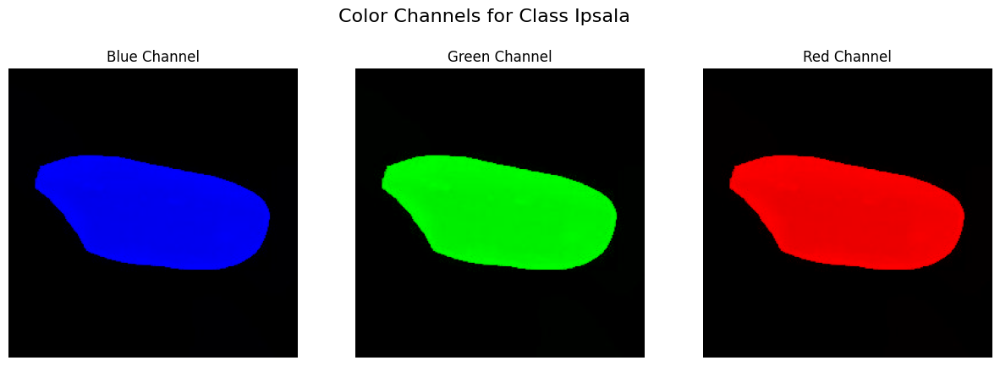

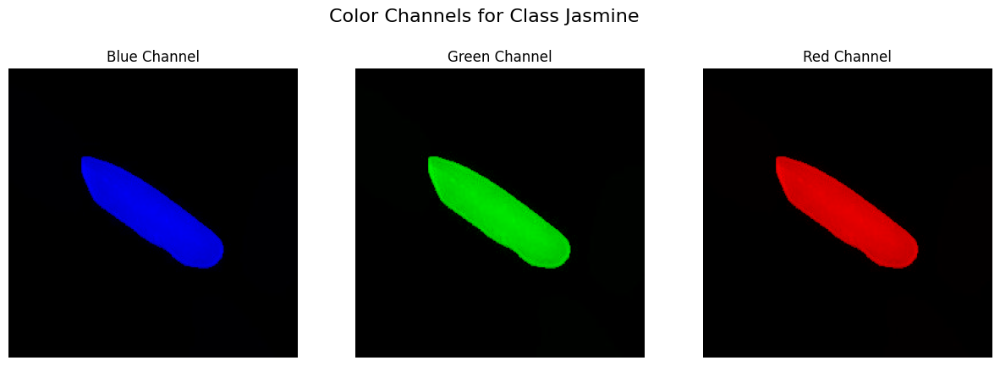

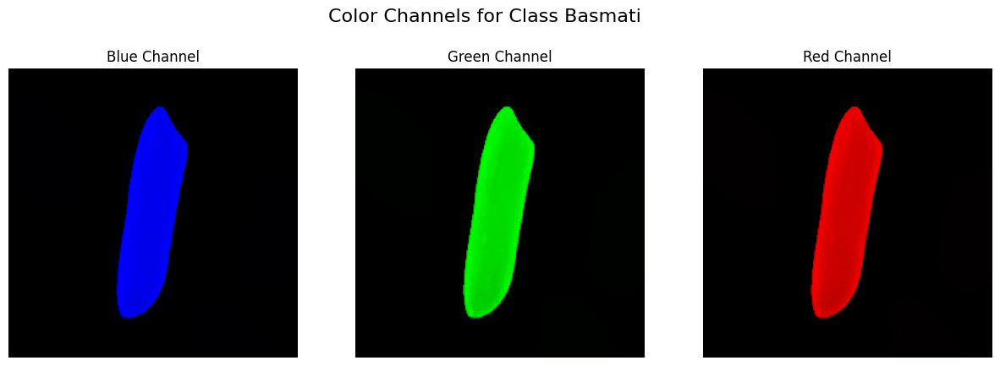

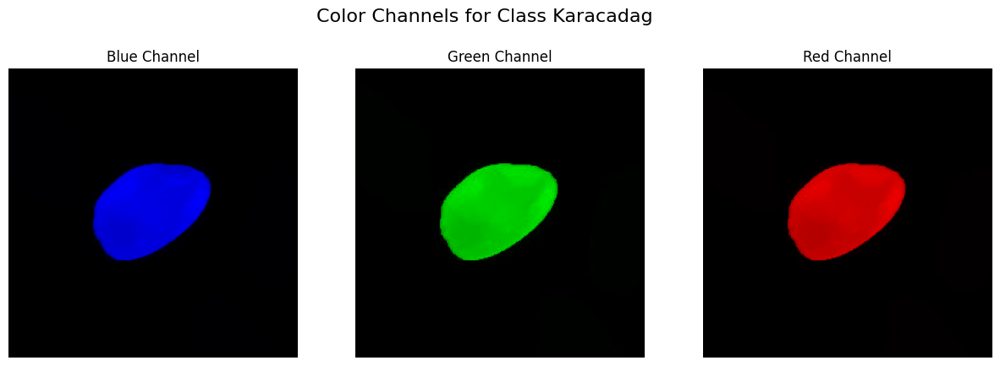

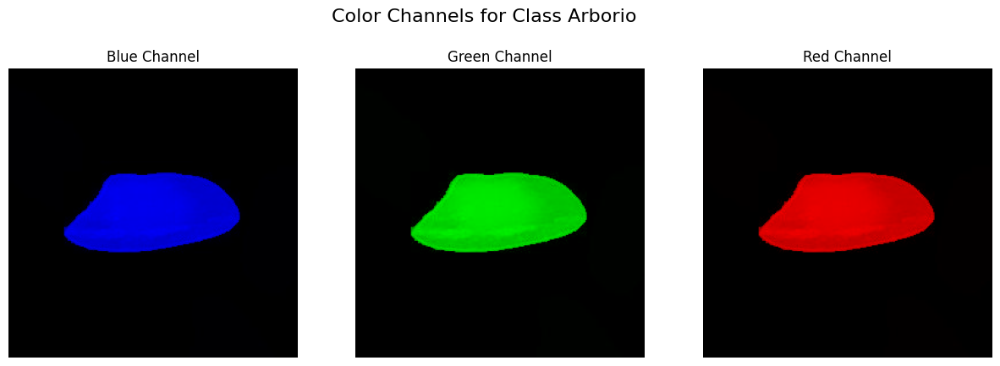

In [33]:
show_rgb(test_path, num_images=1)

***Insight:***

Untuk data train dan data test, gambar akan ditampilkan dengan Channel RGB. Untuk setiap warna, yaitu merah (Red), hijau (Green), dan biru (Blue), akan dipisahkan untuk menampilkan warna dominan. Dari hasil gambar, tidak ditemukan adanya warna biru, hijau, dan merah yang dominan. Hal ini sesuai dengan keterangan sebelumnya yang menyatakan bahwa gambar-gambar tersebut didominasi oleh warna hitam dan putih pada *color map gray*. Namun, jika menampilkan *color map*, terlihat jelas beberapa garis putih pada gambar warna hijau (Green) dan beberapa gambar pada merah (Red), hijau (Green)

---


### **Gambar Channel CYMK**

---

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (7437).jpg


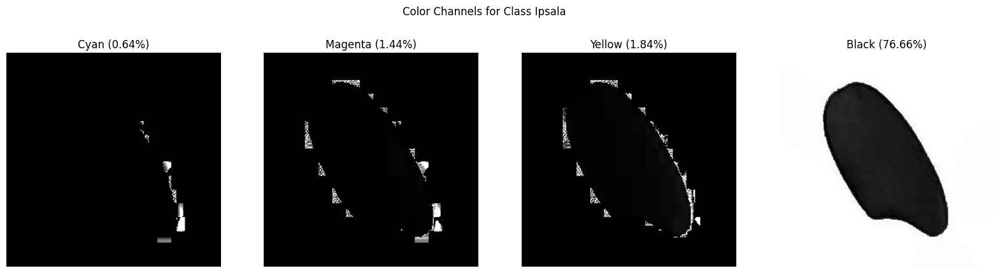

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (9998).jpg


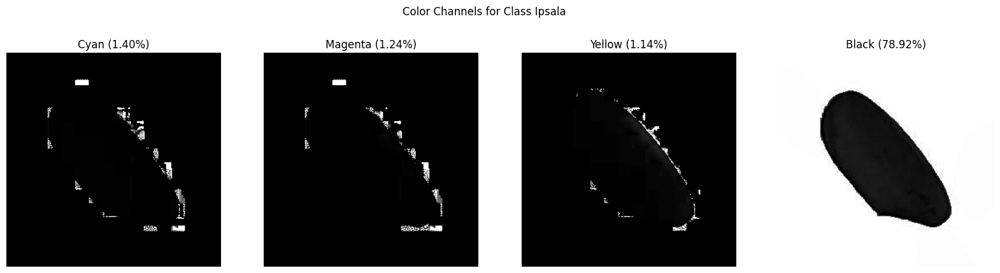

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (8570).jpg


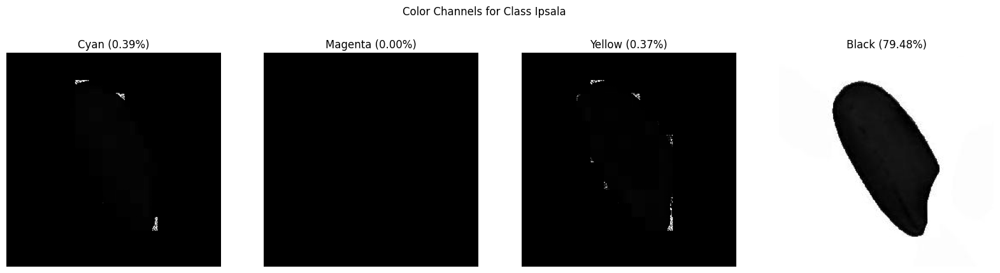

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (10946).jpg


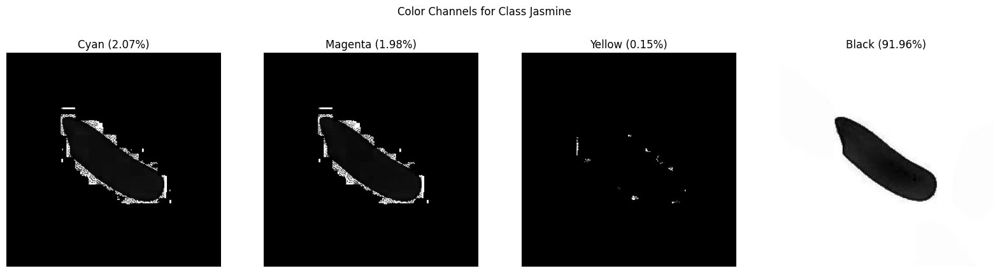

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (1941).jpg


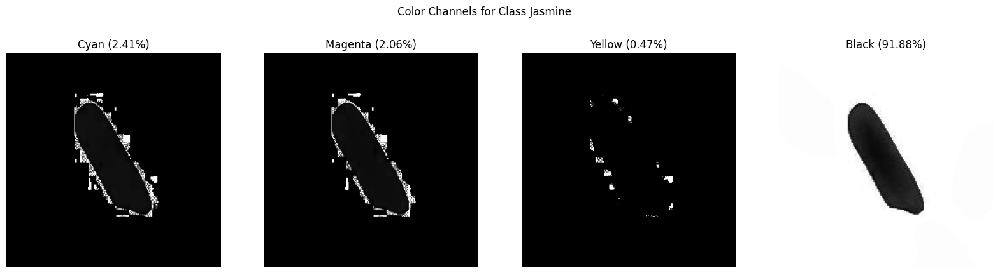

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (3391).jpg


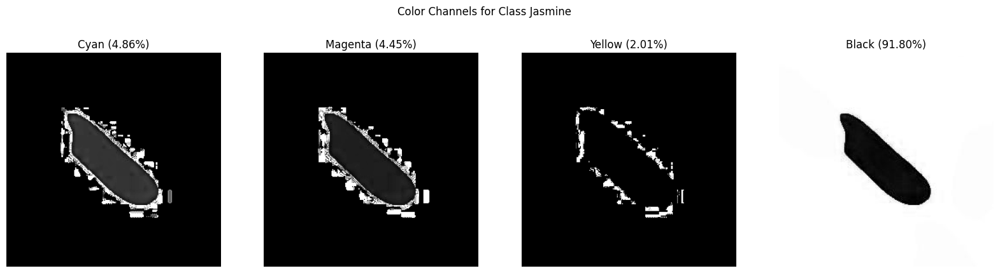

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (4950).jpg


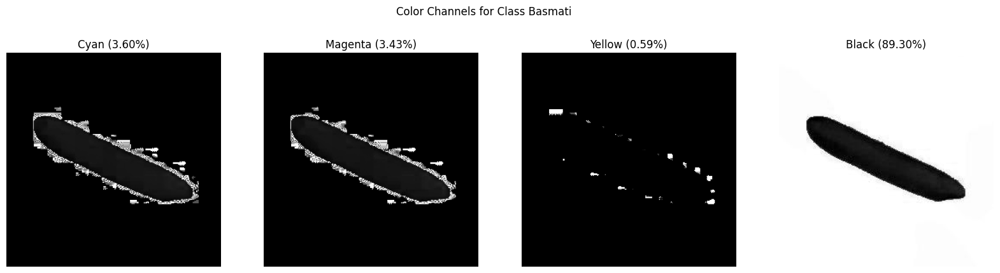

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (9451).jpg


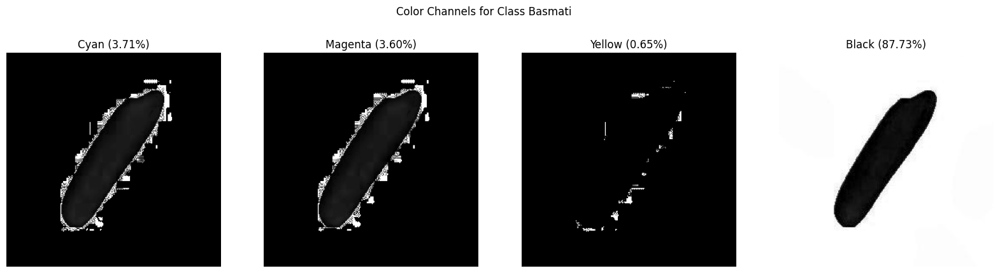

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (11).jpg


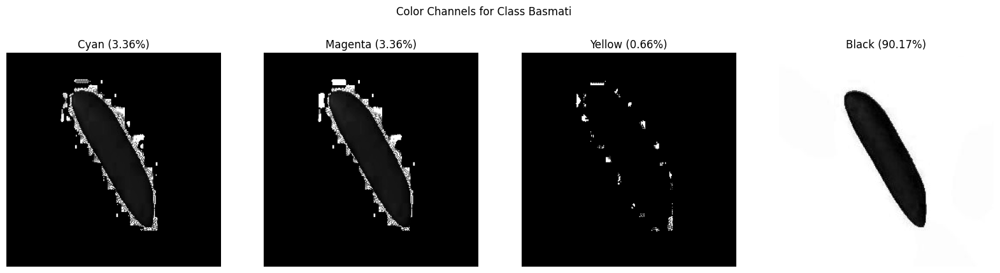

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (12509).jpg


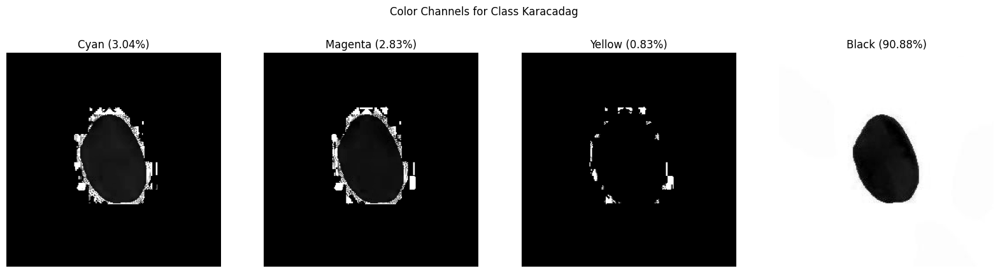

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (9923).jpg


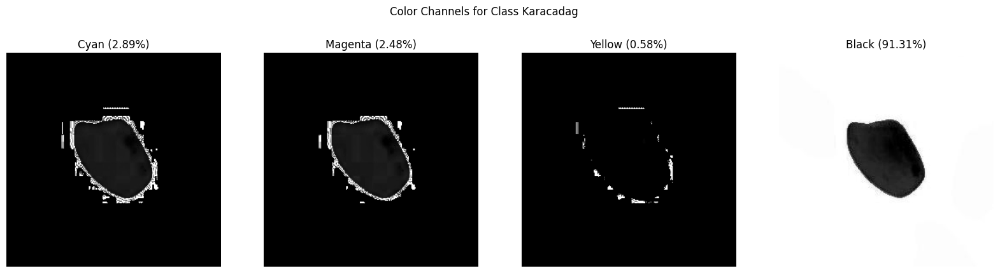

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (8753).jpg


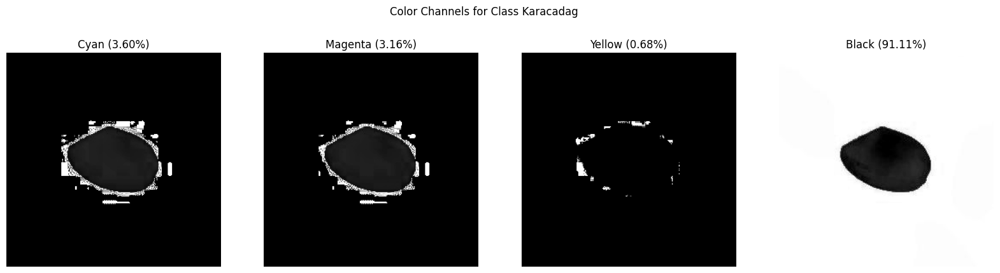

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (8398).jpg


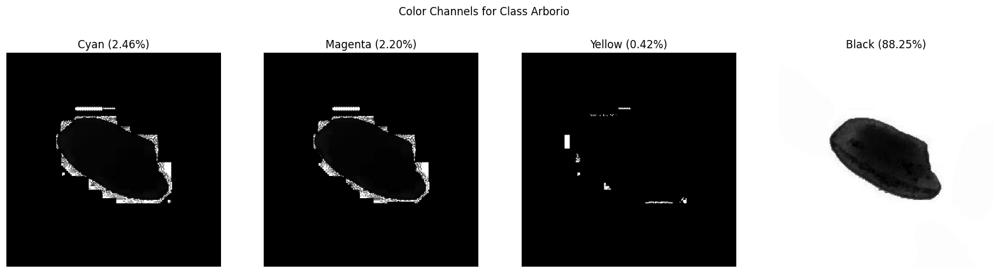

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3877).jpg


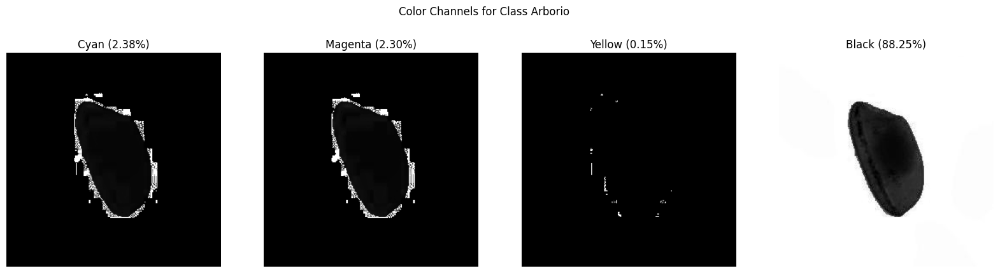

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3766).jpg


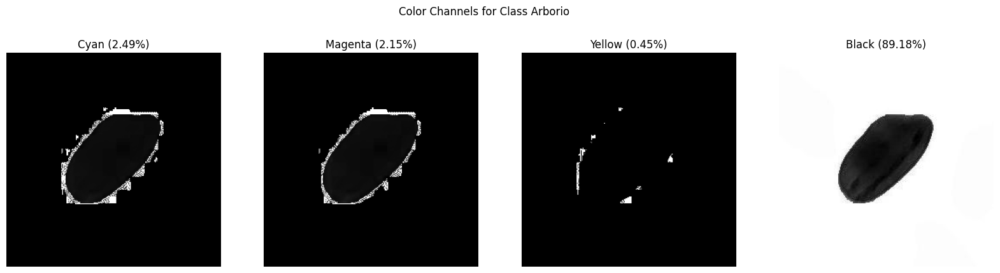

In [34]:
show_color_channels_cymk(train_path, num_images=3)

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (6436).jpg


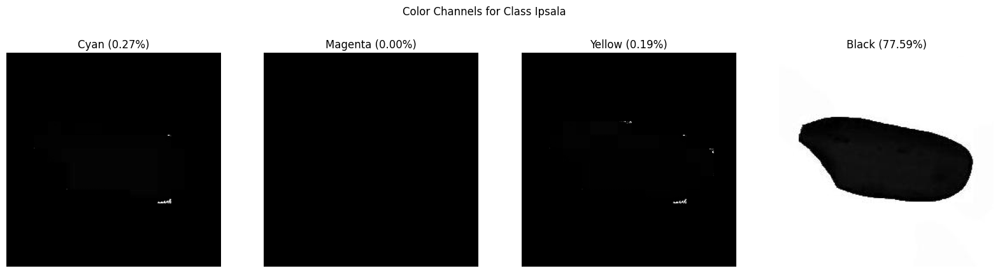

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (172).jpg


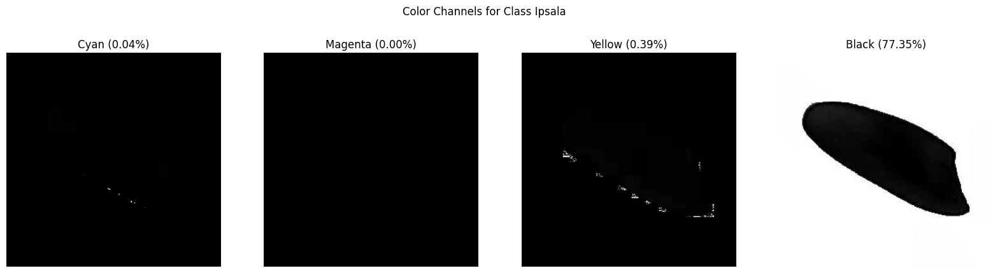

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (8674).jpg


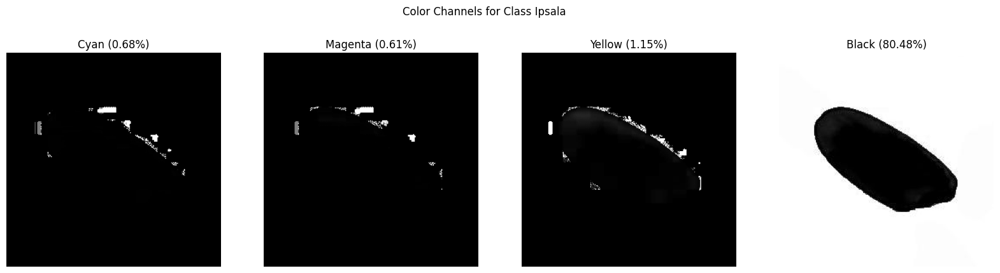

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (7745).jpg


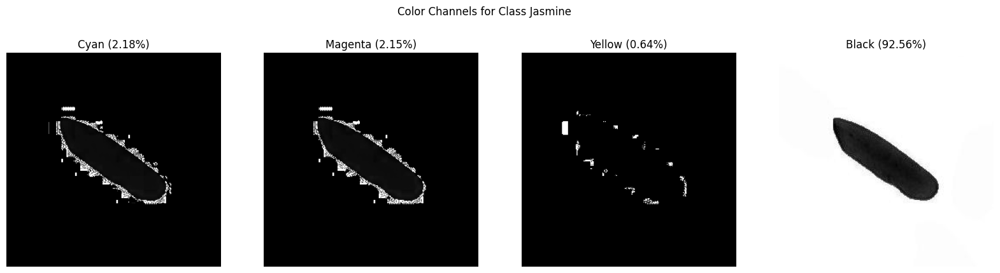

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (6104).jpg


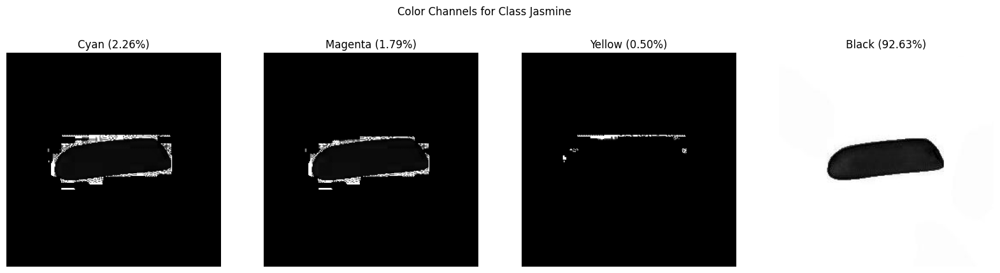

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (8464).jpg


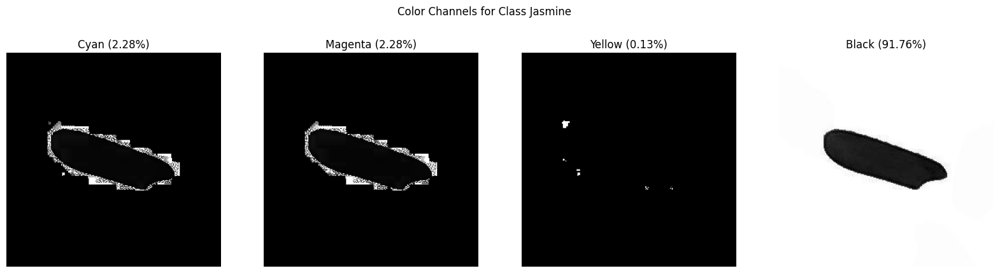

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (4253).jpg


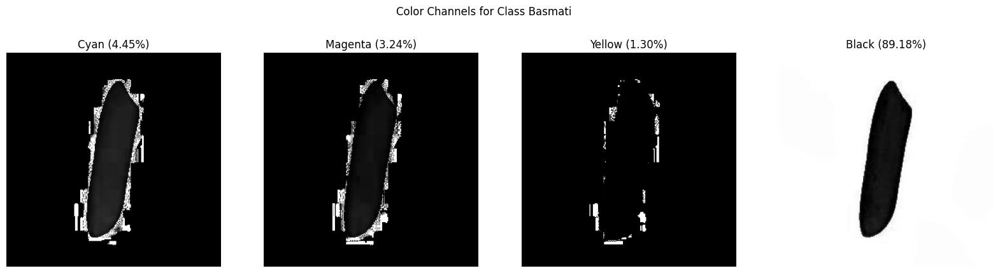

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (13061).jpg


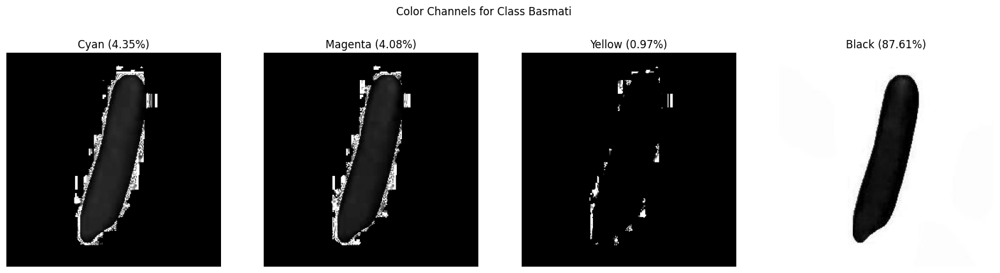

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (14585).jpg


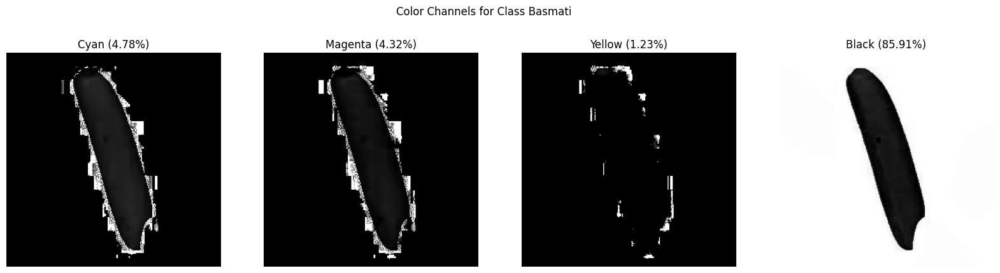

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (10715).jpg


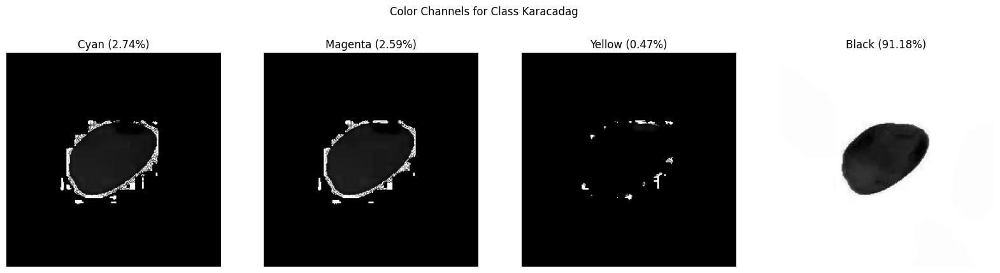

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (21).jpg


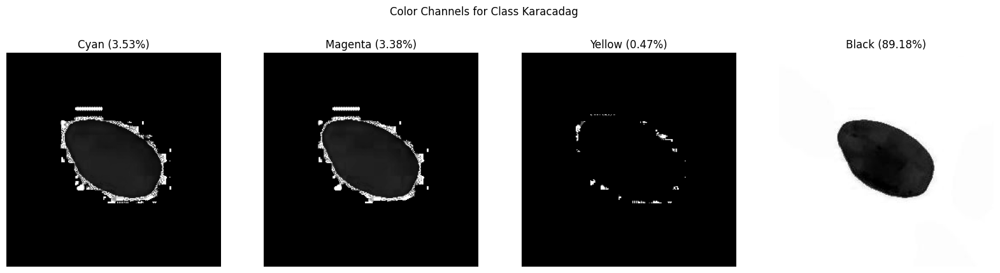

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (8484).jpg


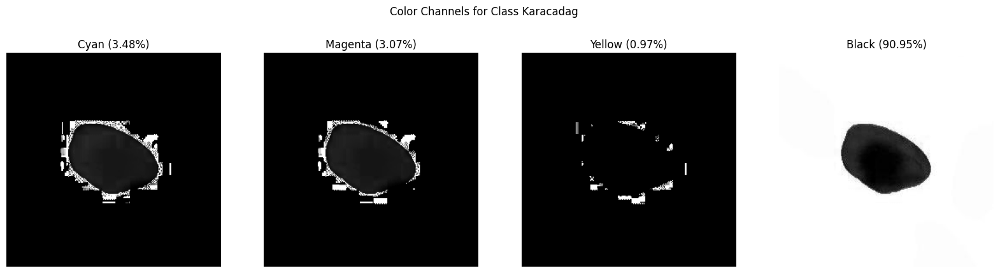

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (14843).jpg


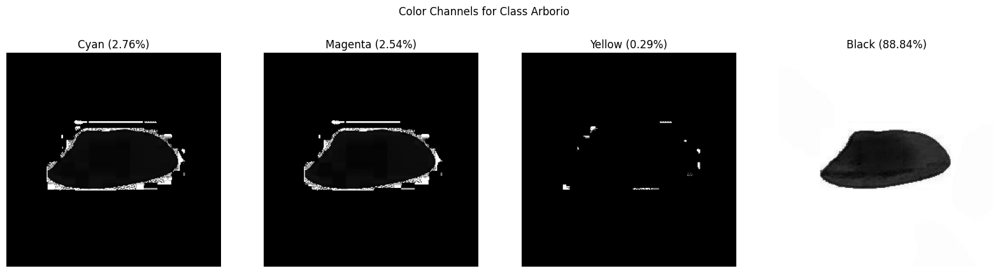

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (9029).jpg


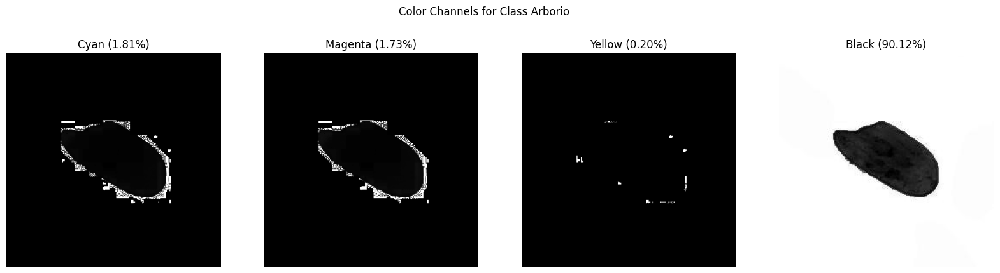

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (11430).jpg


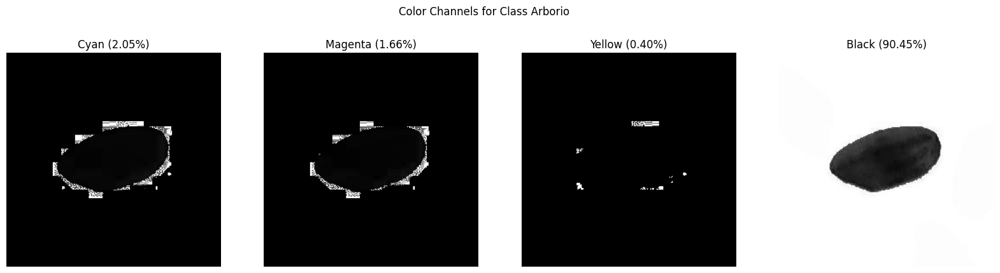

In [35]:
show_color_channels_cymk(test_path, num_images=3)

***Insight:***

Gambar yang dalam format RGB akan diubah menjadi format CMYK (Cyan, Magenta, Yellow, Black). Dari hasil konversi, terlihat garis-garis samar pada warna *Cyan*, *Magenta*, dan *Yellow* dengan persentase di bawah 5%. Sedangkan, persentase warna *Black* diperoleh sekitar 90% baik untuk data test maupun data train. Hal ini menunjukkan bahwa dominasi warna pada gambar adalah warna hitam.

---

### **Tepi Gambar**

---

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (7437).jpg


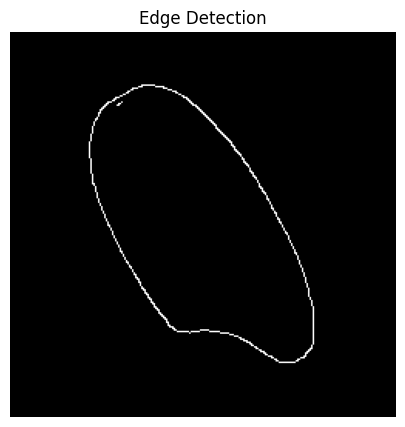

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (9998).jpg


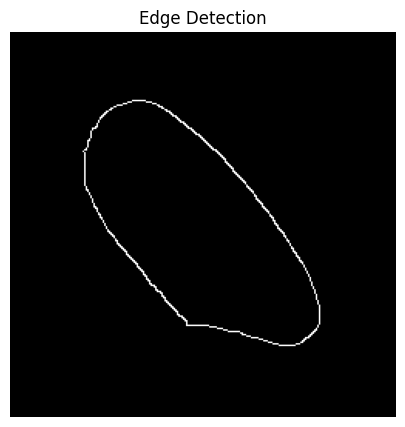

Analyzing image: /content/Rice_Image_Dataset/train/Ipsala/Ipsala (8570).jpg


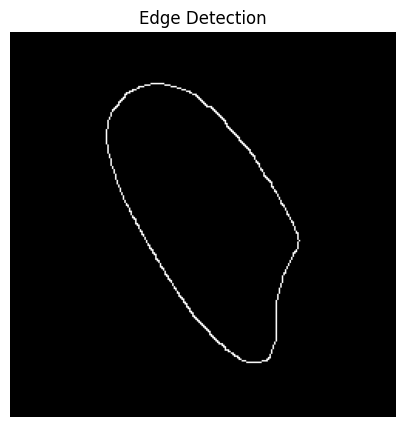

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (10946).jpg


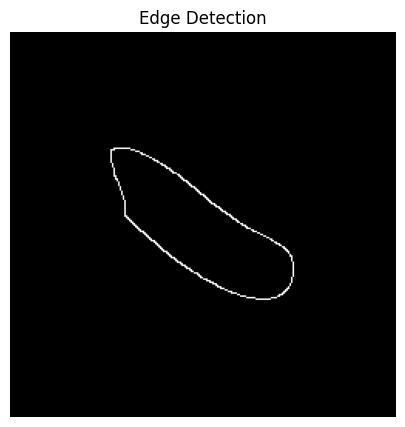

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (1941).jpg


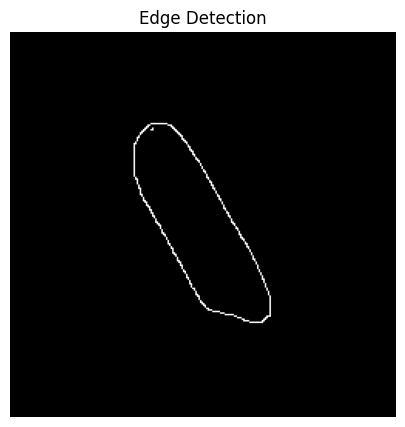

Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (3391).jpg


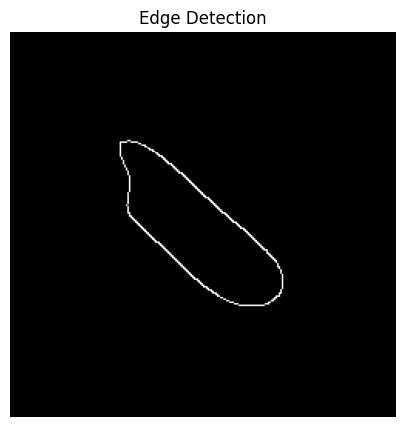

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (4950).jpg


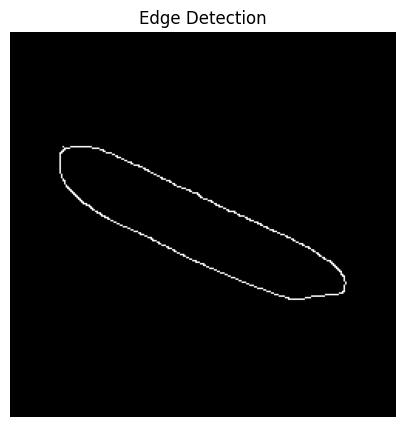

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (9451).jpg


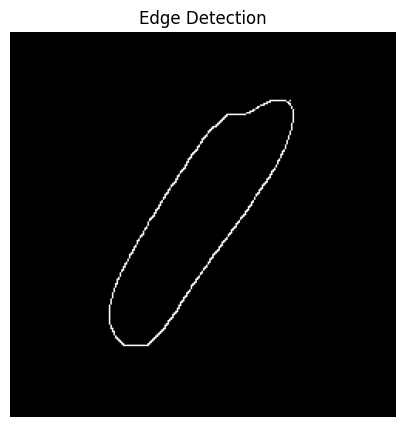

Analyzing image: /content/Rice_Image_Dataset/train/Basmati/basmati (11).jpg


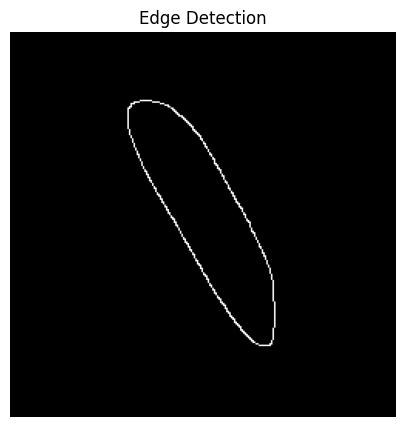

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (12509).jpg


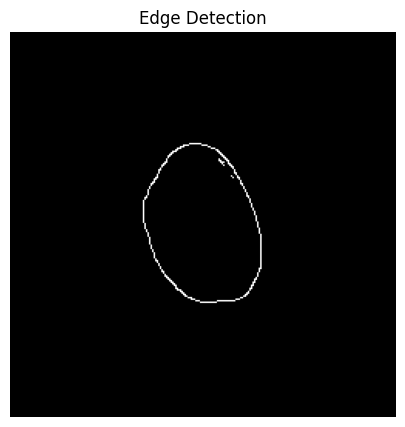

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (9923).jpg


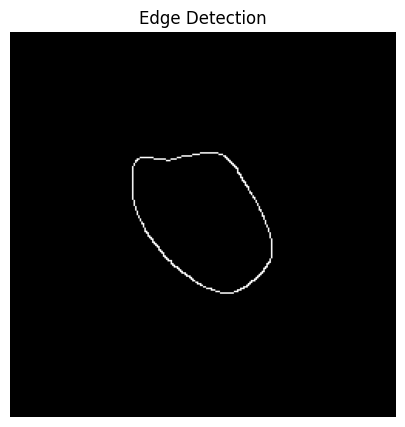

Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (8753).jpg


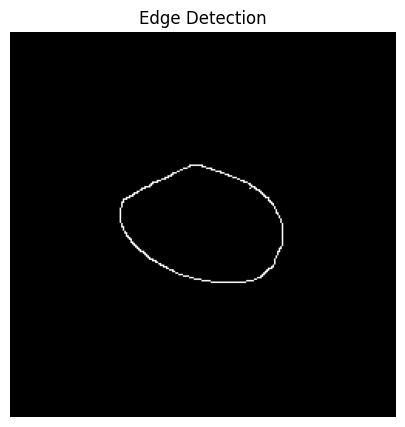

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (8398).jpg


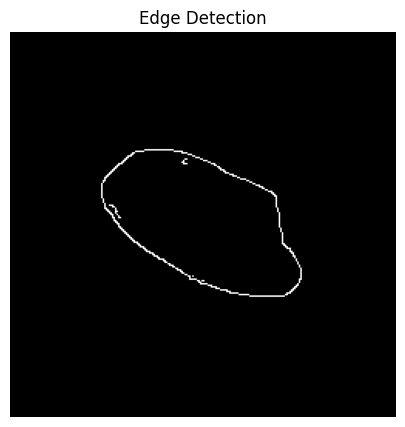

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3877).jpg


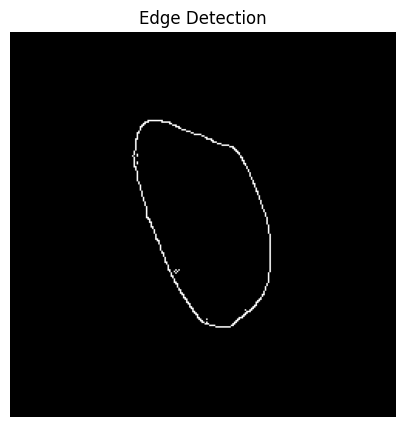

Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (3766).jpg


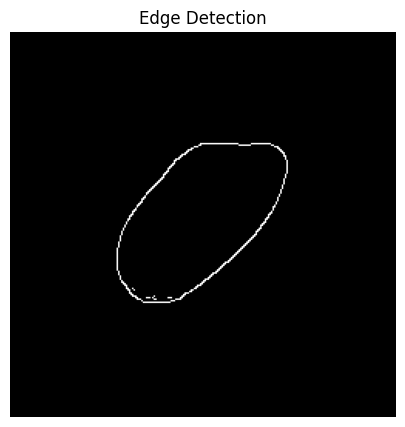

In [36]:
show_edges(train_path, num_images=3)

Class: Ipsala
Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (6436).jpg


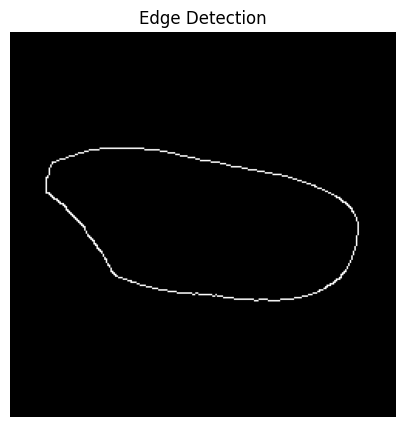

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (172).jpg


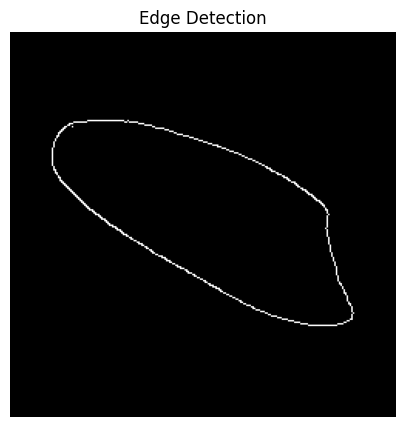

Analyzing image: /content/Rice_Image_Dataset/val/Ipsala/Ipsala (8674).jpg


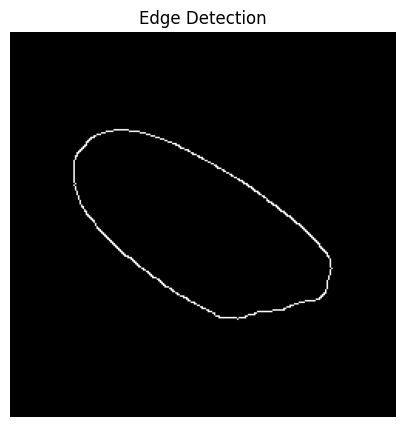

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (7745).jpg


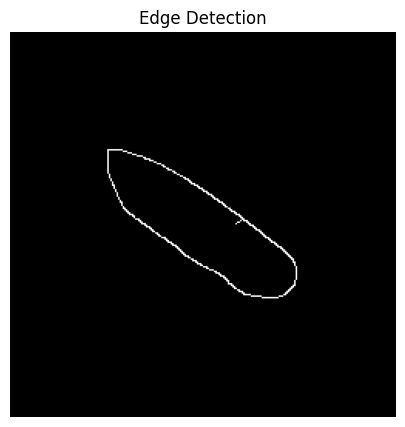

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (6104).jpg


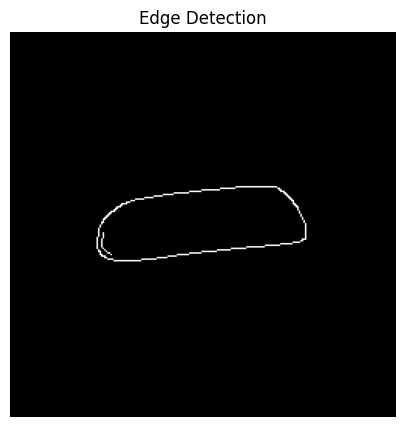

Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (8464).jpg


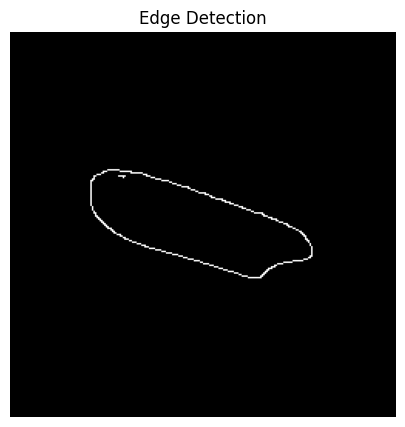

Class: Basmati
Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (4253).jpg


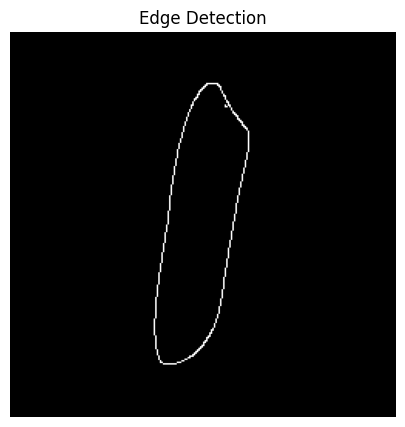

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (13061).jpg


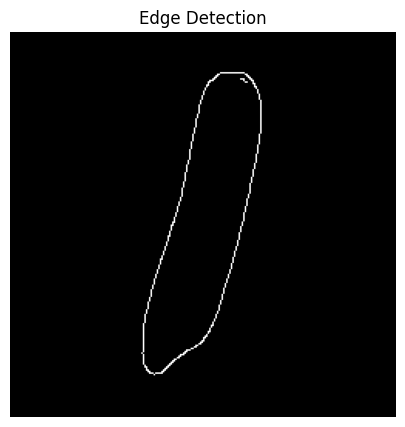

Analyzing image: /content/Rice_Image_Dataset/val/Basmati/basmati (14585).jpg


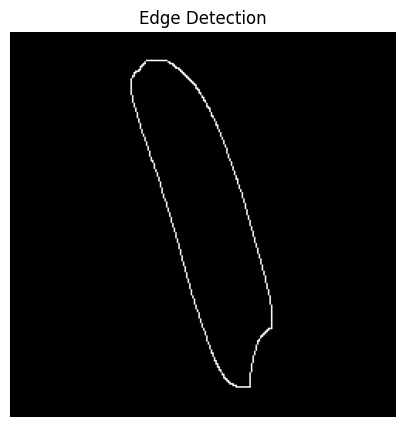

Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (10715).jpg


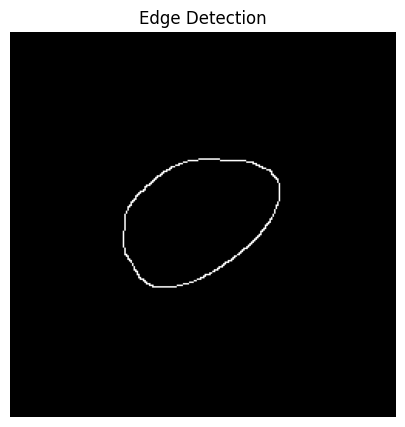

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (21).jpg


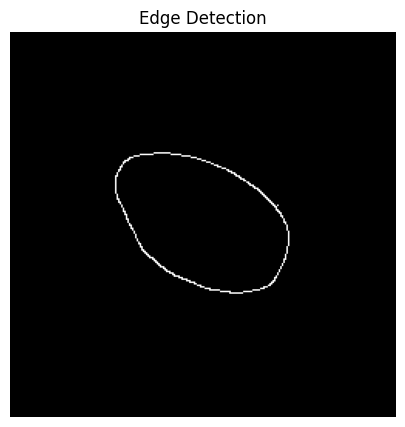

Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (8484).jpg


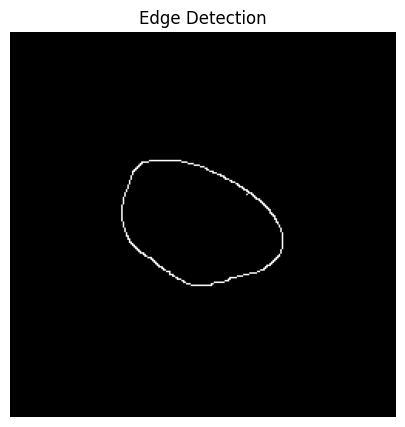

Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (14843).jpg


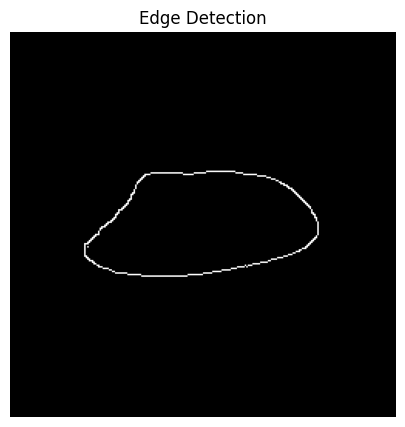

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (9029).jpg


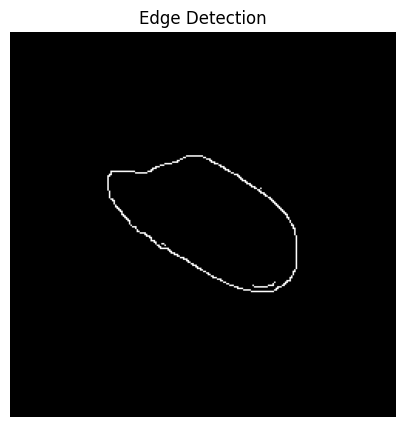

Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (11430).jpg


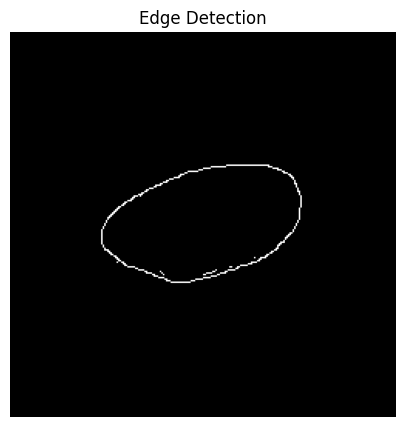

In [37]:
show_edges(test_path, num_images=3)

***Insight:***

Setiap kelas pada dataset akan ditampilkan sebanyak 3 gambar untuk melihat tepi gambar, dengan keterangan sebagai berikut:

- Jasmine:
  - Terlihat ada titik kecil di dalam butiran beras.

- Arborio:
  - Terlihat seperti ada garis dan titik kecil di dalam butiran beras, namun terkadang tidak ada.

- Karacadag:
  - Terdapat titik kecil pada butiran beras, namun tidak ada garis di dalam butiran beras. Terkadang titik dan garis ini juga tidak terdapat.
- Ipsala:
  - Terlihat seperti ada garis dan titik kecil di dalam butiran beras, namun terkadang tidak ada.
- Basmati:
  - Tidak ada garis di dalam butiran beras, namun terkadang ada titik kecil pada butiran beras.

<br/>

Analisis ini mungkin mengandung bias. Oleh karena itu, direkomendasikan untuk melakukan pengecekan pada semua gambar dalam dataset.

---

### **Sudut Gambar**

---

In [ ]:
show_edge_angles(train_path, num_images=3)

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (11243).jpg
No lines detected for image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (11243).jpg
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (336).jpg
No lines detected for image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (336).jpg
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (2474).jpg
No lines detected for image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (2474).jpg
Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (7400).jpg
No lines detected for image: /content/Rice_Image_Dataset/train/Arborio/Arborio (7400).jpg
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (2912).jpg
No lines detected for image: /content/Rice_Image_Dataset/train/Arborio/Arborio (2912).jpg
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (6186).jpg
No lines detected for image: /content/Rice_Image_Dat

In [ ]:
show_edge_angles(test_path, num_images=3)

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (53).jpg
No lines detected for image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (53).jpg
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (296).jpg
No lines detected for image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (296).jpg
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (11947).jpg
No lines detected for image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (11947).jpg
Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (12388).jpg
No lines detected for image: /content/Rice_Image_Dataset/val/Arborio/Arborio (12388).jpg
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (13182).jpg
No lines detected for image: /content/Rice_Image_Dataset/val/Arborio/Arborio (13182).jpg
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (5687).jpg
No lines detected for image: /content/Rice_Image_Dataset/val/Arborio/Arbor

***Insight:***

Dilakukan pengecekan sudut gambar untuk setiap kelasnya dengan mengambil sampel sebanyak 3 gambar. Dari hasil pengecekan, tidak ditemukan sudut pada setiap gambar, yang menunjukkan bahwa bentuk gambar tidak memiliki garis yang jelas atau tepi yang kuat.

---

### **Ukuran Gambar**

---

In [ ]:
show_height_weight(train_path, num_images=3)

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (11243).jpg
Height: 250, Width: 250, Weight: 3333 bytes
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (336).jpg
Height: 250, Width: 250, Weight: 2972 bytes
Analyzing image: /content/Rice_Image_Dataset/train/Jasmine/Jasmine (2474).jpg
Height: 250, Width: 250, Weight: 3175 bytes
Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (7400).jpg
Height: 250, Width: 250, Weight: 3982 bytes
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (2912).jpg
Height: 250, Width: 250, Weight: 3901 bytes
Analyzing image: /content/Rice_Image_Dataset/train/Arborio/Arborio (6186).jpg
Height: 250, Width: 250, Weight: 3318 bytes
Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (5497).jpg
Height: 250, Width: 250, Weight: 3286 bytes
Analyzing image: /content/Rice_Image_Dataset/train/Karacadag/Karacadag (9332).jpg
Height: 250, 

In [ ]:
show_height_weight(test_path, num_images=3)

Class: Jasmine
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (53).jpg
Height: 250, Width: 250, Weight: 3115 bytes
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (296).jpg
Height: 250, Width: 250, Weight: 3305 bytes
Analyzing image: /content/Rice_Image_Dataset/val/Jasmine/Jasmine (11947).jpg
Height: 250, Width: 250, Weight: 3788 bytes
Class: Arborio
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (12388).jpg
Height: 250, Width: 250, Weight: 3145 bytes
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (13182).jpg
Height: 250, Width: 250, Weight: 3342 bytes
Analyzing image: /content/Rice_Image_Dataset/val/Arborio/Arborio (5687).jpg
Height: 250, Width: 250, Weight: 3633 bytes
Class: Karacadag
Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (12407).jpg
Height: 250, Width: 250, Weight: 3079 bytes
Analyzing image: /content/Rice_Image_Dataset/val/Karacadag/Karacadag (12560).jpg
Height: 250, Width: 250, We

***Insight:***

Dilakukan pengecekan tinggi, lebar, dan ukuran file gambar untuk setiap kelasnya dengan mengambil sampel sebanyak 3 gambar. Dari hasil pengecekan, ditemukan bahwa tinggi dan lebar gambar konsisten sebesar 250 piksel, dan ukuran file gambar berkisar antara 3000 - 4000 byte untuk setiap ukuran gambar.

---

## ***Base Model***

---

### ***Preprocessing***

---

In [ ]:
# Defenisikan Hyperparameters
img_height= 220
img_width= 220
batch_size= 256

In [ ]:
# Buat Generator Batch Untuk train-set, val-set, dan test-set
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                validation_split=0.4)

train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='sparse',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True,
                                              seed=2)

val_set = train_datagen.flow_from_directory(train_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            subset='validation',
                                            batch_size=batch_size,
                                            shuffle=True,
                                            seed=2)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='sparse',
                                            batch_size=batch_size,
                                            shuffle=False,
                                            seed=2)

Found 36000 images belonging to 5 classes.
Found 24000 images belonging to 5 classes.
Found 15000 images belonging to 5 classes.


In [ ]:
# Menunjukkan label
train_set.class_indices

{'Arborio': 0, 'Basmati': 1, 'Ipsala': 2, 'Jasmine': 3, 'Karacadag': 4}

***Insight:***

- Karena terdapat 75.000 gambar dalam dataset, akan dilakukan pembagian data menjadi 3 bagian dengan proporsi sebagai berikut:
  - 36.000 data untuk data train
  - 24.000 data untuk data validation
  - 15.000 data untuk data test

- Data ini akan diidentifikasi dalam 5 kategori atau kelas yang berbeda.

- Mengubah ukuran gambar dari 250x250 piksel menjadi 220x220 memang tidak terlalu signifikan dalam hal perubahan ukuran, namun hal ini dilakukan untuk mengoptimalkan penggunaan sumber daya komputasi yang tersedia.

---

### ***Model Defenition***

---

In [ ]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
# Model Sequential API
model = Sequential()
model.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3,3),activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(512, activation='relu'))
model.add(Dense(5, activation='softmax'))

# Compile
model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 109, 109, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 25, 25, 128)       0

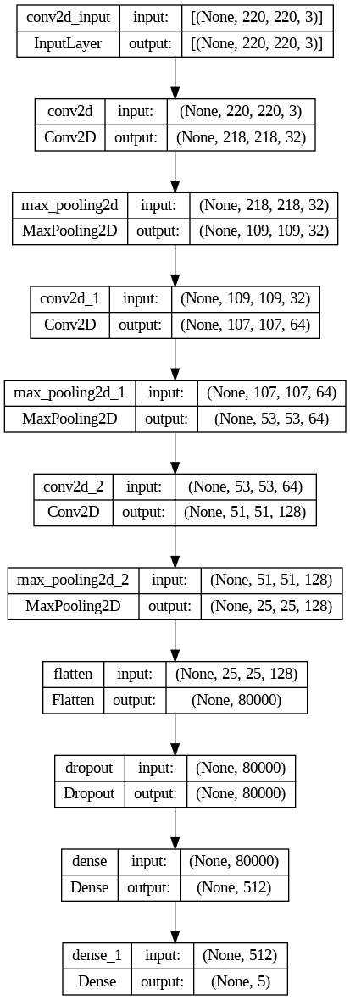

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model, show_shapes=True)

***Insight:***

- Model neural network ini adalah model yang terdiri dari tiga lapisan konvolusi (*convolutional layers*) yang diikuti oleh lapisan *max pooling* untuk mengekstraksi fitur dari gambar input. Setelah itu, fitur-fitur tersebut diteruskan ke dalam lapisan *fully connected* (*dense layers*) dengan *dropout* untuk mengurangi *overfitting*, dan akhirnya lapisan output dengan fungsi aktivasi *softmax* untuk klasifikasi multikelas. Total parameter model ini sebesar 41.056.325, dengan sebagian besar parameter terletak pada lapisan dense yang menghubungkan fitur-fitur yang diekstraksi dengan output kelas yang sesuai.
- Secara spesifik, arsitektur ini memiliki:
  - 3 lapisan konvolusi
    - Jumlah filter sebanyak 32, 64, 128 filter yang dimana semakin banyak filter, semakin banyak fitur yang dapat dikenali oleh model.
    - Menggunakan padding default (padding='valid').
    - Striding berjumlah (3,3), jumlah ini sedikit sehingga menampilkan gambar secara detail.

  - 3 lapisan pooling
    - Tidak menggunakan filter pada operasi pooling.
    - Menggunakan padding default (padding='valid')
    - Striding berjumlah (2,2), jumlah ini sedikit sehingga menampilkan gambar secara detail.

- Flatten():
  Operasi Flatten digunakan untuk meratakan output dari lapisan konvolusi sebelumnya menjadi vektor satu dimensi. Ini diperlukan sebelum masuk ke lapisan Dense (fully connected).

- Dropout(0.5):
  Dropout dengan nilai 0.5 (50%) digunakan untuk memasukkan dropout ke dalam model. Ini membantu mengurangi overfitting dengan secara acak menghapus unit-unit selama proses pelatihan.

- Dense(512, activation='relu'):
  Lapisan Dense dengan 512 unit dan aktivasi ReLU. Lapisan ini mengambil input dari hasil Flatten dan menggunakan fungsi aktivasi ReLU untuk menambahkan non-linearitas.

- Dense(5, activation='softmax'):
  Lapisan output dengan 5 unit (karena terdapat 5 kelas yang dihasilkan oleh softmax) dan aktivasi softmax.


---

### ***Model Training***

---

In [ ]:
# Train Model
%%time
history = model.fit(train_set, epochs=25, validation_data=val_set, batch_size=batch_size)

Epoch 1/25
141/141 [==============================] - 488s 3s/step - loss: 0.1744 - accuracy: 0.9482 - val_loss: 1.3833 - val_accuracy: 0.8795
Epoch 2/25
141/141 [==============================] - 485s 3s/step - loss: 0.0546 - accuracy: 0.9811 - val_loss: 1.3578 - val_accuracy: 0.8747
Epoch 3/25
141/141 [==============================] - 482s 3s/step - loss: 0.0441 - accuracy: 0.9860 - val_loss: 1.4621 - val_accuracy: 0.8785
Epoch 4/25
141/141 [==============================] - 482s 3s/step - loss: 0.0347 - accuracy: 0.9883 - val_loss: 1.4962 - val_accuracy: 0.8832
Epoch 5/25
141/141 [==============================] - 483s 3s/step - loss: 0.0257 - accuracy: 0.9921 - val_loss: 1.8345 - val_accuracy: 0.8865
Epoch 6/25
141/141 [==============================] - 483s 3s/step - loss: 0.0250 - accuracy: 0.9915 - val_loss: 1.6676 - val_accuracy: 0.8857
Epoch 7/25
141/141 [==============================] - 484s 3s/step - loss: 0.0184 - accuracy: 0.9939 - val_loss: 2.0102 - val_accuracy: 0.8870

***Insight:***

Output tersebut menunjukkan hasil pelatihan model neural network selama 25 epoch, di mana model mencapai akurasi pelatihan yang sangat tinggi sebesar 99.90%, tetapi akurasi validasi stabil di sekitar 88.84%. Nilai *loss* pada data validasi terus meningkat, menunjukkan tanda-tanda *overfitting*.

---

### ***Model Evaluation***

---

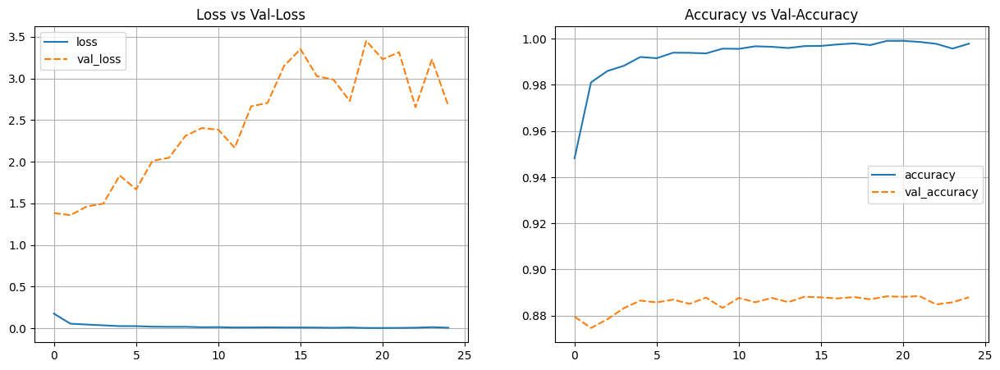

In [ ]:
# Plot Hasil Training
history_df = pd.DataFrame(history.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [ ]:
# Cek Performance dari test-set

# Mendapatkan Peluang
y_pred_prob = model.predict(test_set)

# Mendapatkan Peluang dengan Nilai Maximum
y_pred_class = np.argmax(y_pred_prob, axis=-1)

# Menampilkan Classification Report
print(classification_report(test_set.classes, y_pred_class, target_names=np.array(list(train_set.class_indices.keys()))))

59/59 [==============================] - 46s 762ms/step
              precision    recall  f1-score   support

     Arborio       0.99      0.99      0.99      3000
     Basmati       0.82      0.99      0.90      3000
      Ipsala       1.00      1.00      1.00      3000
     Jasmine       0.99      0.78      0.87      3000
   Karacadag       1.00      1.00      1.00      3000

    accuracy                           0.95     15000
   macro avg       0.96      0.95      0.95     15000
weighted avg       0.96      0.95      0.95     15000



***Insight:***

- Laporan klasifikasi menunjukkan bahwa model memiliki akurasi keseluruhan 95%, dengan kinerja yang sangat baik pada sebagian besar kelas. Model menunjukkan precision dan recall yang sempurna (1.00) untuk kelas Arborio, Ipsala, dan Karacadag, sementara kelas Jasmine dan Basmati memiliki beberapa kelemahan. Khususnya, kelas Jasmine memiliki recall yang lebih rendah (0.78), menunjukkan bahwa model tidak berhasil mengenali semua contoh dari kelas ini, meskipun precision-nya tinggi (0.99). Sebaliknya, kelas Basmati memiliki precision yang lebih rendah (0.82), menunjukkan beberapa prediksi yang salah untuk kelas ini, meskipun recall-nya sempurna (1.00). Rata-rata macro dan *weighted* untuk precision, recall, dan F1-score semuanya sekitar 0.95, mencerminkan kinerja yang konsisten dan kuat dari model pada dataset ini.

- Grafik menunjukkan bahwa model mengalami *overfitting*. Meskipun model sangat baik dalam memprediksi data pelatihan (dengan akurasi hampir 100% dan *loss* yang sangat rendah), model tidak dapat mempertahankan performa tersebut pada data validasi (dengan *loss* yang meningkat dan akurasi yang stagnan sekitar 88%). Untuk mengatasi *overfitting*, beberapa langkah yang dapat diambil meliputi penggunaan *regularisasi*, penambahan *dropout*, augmentasi data, atau mengurangi kompleksitas model.

- Karena mengalami *overfitting*, akan dicoba menggunakan data augmentasi

---

## ***Model Data Augmentation (Model Improvement)***

---

### ***Feature Enggineering & Preprocessing***

---

In [ ]:
# Defenisikan Hyperparameters
img_height= 220
img_width= 220
batch_size= 256

In [ ]:
# Buat Generator Batch Untuk train-set, val-set, dan test-set
train_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,
                                                                    rotation_range=40,
                                                                    width_shift_range=0.2,
                                                                    height_shift_range=0.2,
                                                                    shear_range=0.2,
                                                                    zoom_range=0.2,
                                                                    horizontal_flip=True,
                                                                    fill_mode='nearest',
                                                                    brightness_range=[0.5, 1.5],
                                                                    channel_shift_range=20,
                                                                    vertical_flip=True,
                                                                    validation_split=0.2)

train_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                                      target_size=(img_height,img_width),
                                                      class_mode='sparse',
                                                      subset='training',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    subset='validation',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

test_datagen_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set_aug = test_datagen_aug.flow_from_directory(test_path,
                                                target_size=(img_height,img_width),
                                                class_mode='sparse',
                                                batch_size=batch_size,
                                                shuffle=False,
                                                seed=2)

Found 48000 images belonging to 5 classes.
Found 12000 images belonging to 5 classes.
Found 15000 images belonging to 5 classes.


***Insight:***

*Data augmentation* merupakan bagian dari *feature engineering* dari *computer vision*. Pada sesi ini akan dibantu dengan menggunakan `ImageDataGenerator` dengan keterangan sebagai berikut:

- rescale:
  - Parameter ini digunakan untuk mengubah skala nilai piksel dalam gambar. Dalam contoh rescale=1./255, setiap nilai piksel akan dibagi dengan 255, sehingga nilai piksel berada dalam rentang 0 hingga 1.

- rotation_range:
  - Rentang rotasi dalam derajat untuk rotasi acak gambar. Dalam contoh rotation_range=40, gambar dapat diputar dalam rentang -40 derajat hingga +40 derajat secara acak.

- width_shift_range dan height_shift_range:
  - Rentang pergeseran horizontal dan vertikal sebagai pecahan dari dimensi total gambar. Misalnya, width_shift_range=0.2 berarti gambar dapat dipindahkan ke kanan atau kiri sebanyak 20% dari lebar gambar secara acak.

- shear_range:
  - Rentang pergeseran sudut dalam arah searah jarum jam dalam derajat. Ini memberikan efek miring atau 'shearing' pada gambar.

- zoom_range:
  - Rentang zoom acak. Misalnya, zoom_range=0.2 memungkinkan untuk memperbesar atau memperkecil gambar hingga 20% secara acak.

- horizontal_flip dan vertical_flip:
  - Menentukan apakah flip horizontal dan vertikal akan diterapkan pada gambar. Ini meningkatkan variasi data dengan menciptakan gambar yang memiliki orientasi yang berbeda.

- fill_mode:
  - Metode untuk mengisi area yang baru dibuat setelah pergeseran atau rotasi gambar. Misalnya, 'nearest' akan mengisi dengan piksel terdekat, 'constant' akan mengisi dengan nilai tetap.

- brightness_range:
  - Rentang nilai kecerahan yang mungkin diterapkan pada gambar asli.

- channel_shift_range:
  - Rentang pergeseran nilai untuk setiap saluran warna dalam gambar.

- validation_split:
  - Persentase data yang akan diambil untuk digunakan sebagai data validasi.

<br/>

Mengubah ukuran gambar dari 250x250 piksel menjadi 220x220 memang tidak terlalu signifikan dalam hal perubahan ukuran, namun hal ini dilakukan untuk mengoptimalkan penggunaan sumber daya komputasi yang tersedia. Data ini akan diidentifikasi dalam 5 kategori atau kelas yang berbeda.

---

### ***Model Defenition***

---

In [ ]:
# Clear session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
# Model Sequential API
model_aug = Sequential()
model_aug.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Conv2D(64, (3,3), activation='relu'))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Conv2D(128, (3,3),activation='relu'))
model_aug.add(MaxPooling2D(2, 2))
model_aug.add(Flatten())
model_aug.add(Dropout(0.2))
model_aug.add(Dense(512, activation='relu'))
model_aug.add(Dense(5, activation='softmax'))

# Compile
model_aug.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model_aug.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 218, 218, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 109, 109, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 107, 107, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 53, 53, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 51, 51, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 25, 25, 128)      

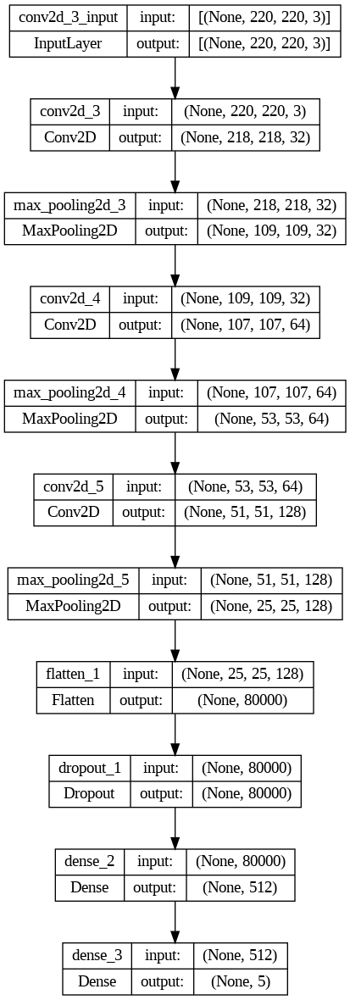

In [ ]:
# Plot layers
tf.keras.utils.plot_model(model_aug, show_shapes=True)

***Insight:***

- Model ini memiliki total 41,056,838 parameter yang dapat dilatih (*trainable parameters*), dengan tidak ada parameter yang tidak dapat dilatih (*non-trainable parameters*). Model ini terdiri dari beberapa lapisan konvolusional dan pooling untuk ekstraksi fitur, diikuti oleh lapisan *flatten* dan *dense* untuk klasifikasi. Terdapat juga lapisan dropout untuk mengurangi *overfitting*. Model ini akan melakukan tugas klasifikasi gambar dengan 5 kelas output.
- Secara spesifik, arsitektur ini memiliki:
  - 3 lapisan konvolusi
    - Jumlah filter sebanyak 32, 64, 128 filter yang dimana semakin banyak filter, semakin banyak fitur yang dapat dikenali oleh model.
    - Menggunakan padding default (padding='valid').
    - Striding berjumlah (3,3), jumlah ini sedikit sehingga menampilkan gambar secara detail.

  - 3 lapisan pooling
    - Tidak menggunakan filter pada operasi pooling.
    - Menggunakan padding default (padding='valid')
    - Striding berjumlah (2,2), jumlah ini sedikit sehingga menampilkan gambar secara detail.

- Flatten():
  Operasi Flatten digunakan untuk meratakan output dari lapisan konvolusi sebelumnya menjadi vektor satu dimensi. Ini diperlukan sebelum masuk ke lapisan Dense (fully connected).

- Dropout(0.2):
  Dropout dengan nilai 0.2 (20%) digunakan untuk memasukkan dropout ke dalam model. Ini membantu mengurangi overfitting dengan secara acak menghapus unit-unit selama proses pelatihan.

- Dense(512, activation='relu'):
  Lapisan Dense dengan 512 unit dan aktivasi ReLU. Lapisan ini mengambil input dari hasil Flatten dan menggunakan fungsi aktivasi ReLU untuk menambahkan non-linearitas.

- Dense(5, activation='softmax'):
  Lapisan output dengan 5 unit (karena terdapat 5 kelas yang dihasilkan oleh softmax) dan aktivasi softmax.

---

### ***Model Training***

---

In [ ]:
# Train model
%%time
history_aug = model_aug.fit(train_set_aug, epochs=25, validation_data=val_set_aug, batch_size=batch_size)

Epoch 1/25
188/188 [==============================] - 941s 5s/step - loss: 0.7856 - accuracy: 0.6684 - val_loss: 0.4661 - val_accuracy: 0.8213
Epoch 2/25
188/188 [==============================] - 935s 5s/step - loss: 0.3636 - accuracy: 0.8563 - val_loss: 0.2552 - val_accuracy: 0.9024
Epoch 3/25
188/188 [==============================] - 932s 5s/step - loss: 0.2633 - accuracy: 0.8993 - val_loss: 0.2641 - val_accuracy: 0.8966
Epoch 4/25
188/188 [==============================] - 936s 5s/step - loss: 0.2096 - accuracy: 0.9211 - val_loss: 0.1651 - val_accuracy: 0.9441
Epoch 5/25
188/188 [==============================] - 934s 5s/step - loss: 0.1739 - accuracy: 0.9355 - val_loss: 0.1233 - val_accuracy: 0.9542
Epoch 6/25
188/188 [==============================] - 935s 5s/step - loss: 0.1439 - accuracy: 0.9469 - val_loss: 0.1553 - val_accuracy: 0.9406
Epoch 7/25
188/188 [==============================] - 936s 5s/step - loss: 0.1508 - accuracy: 0.9452 - val_loss: 0.1707 - val_accuracy: 0.9377

***Insight:***

Hasil training ini menunjukkan kinerja model selama 25 *epoch*. Pada *Epoch* 1, model mencapai akurasi *training* sebesar 66.84% dan akurasi validasi 82.13%, dengan *loss* masing-masing 0.7856 dan 0.4661. Seiring bertambahnya *epoch*, performa model terus meningkat. Misalnya, pada *epoch* 10, akurasi *training* mencapai 95.69% dan akurasi validasi 96.48%, dengan *loss* masing-masing 0.1185 dan 0.0996. Pada akhir pelatihan (*epoch* 25), akurasi training mencapai 97.80% dan akurasi validasi 98.14%, dengan loss masing-masing 0.0622 dan 0.0512. Peningkatan ini menunjukkan bahwa model semakin baik dalam mempelajari pola dari data *training* dan dapat melakukan generalisasi dengan baik terhadap data validasi. *Val_loss* yang lebih rendah dibandingkan dengan loss pada beberapa epoch awal menunjukkan bahwa model tidak mengalami *overfitting*.

---

### ***Model Evaluation***

---

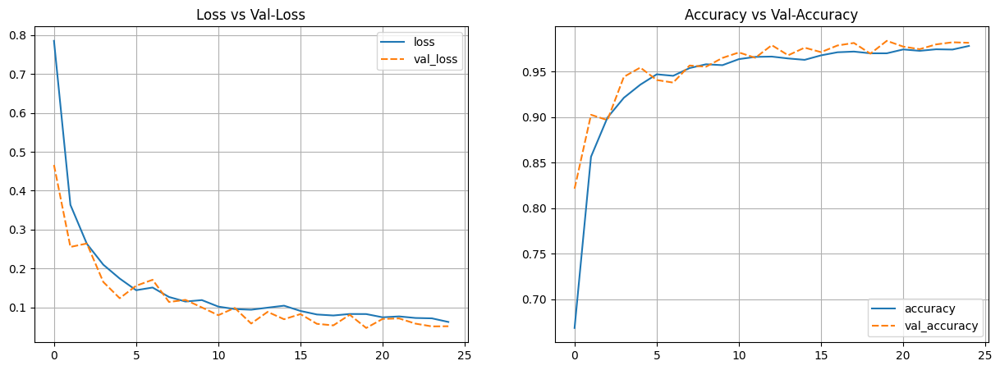

In [ ]:
# Plot Hasil Training
history_aug_df = pd.DataFrame(history_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_aug_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_aug_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [ ]:
# Cek Performance dari test-set

# Mendapatkan Peluang
y_pred_prob_aug = model_aug.predict(test_set_aug)

# Mendapatkan Peluang dengan Nilai Maximum
y_pred_class_aug = np.argmax(y_pred_prob_aug, axis=-1)

# Menampilkan Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_aug, target_names=np.array(list(train_set_aug.class_indices.keys()))))

59/59 [==============================] - 45s 753ms/step
              precision    recall  f1-score   support

     Arborio       0.96      0.98      0.97      3000
     Basmati       0.99      0.99      0.99      3000
      Ipsala       0.98      1.00      0.99      3000
     Jasmine       0.99      0.99      0.99      3000
   Karacadag       1.00      0.96      0.98      3000

    accuracy                           0.98     15000
   macro avg       0.98      0.98      0.98     15000
weighted avg       0.98      0.98      0.98     15000



***Insight:***

- Grafik di atas menunjukkan kurva *Loss* vs *Val-Loss* dan *Accuracy* vs *Val-Accuracy* selama 25 *epoch* pelatihan model. Pada grafik sebelah kiri (*Loss* vs *Val-Loss*), terlihat bahwa nilai loss (kerugian) pada data pelatihan dan validasi menurun dengan cepat pada awal pelatihan dan kemudian stabil di sekitar nilai yang rendah. Hal ini menunjukkan bahwa model belajar dengan baik dan tidak mengalami *overfitting* yang signifikan karena kurva loss pada data validasi tidak naik secara drastis di akhir pelatihan.

- Pada grafik sebelah kanan (*Accuracy* vs *Val-Accuracy*), akurasi pada data pelatihan dan validasi meningkat dengan cepat di awal pelatihan dan kemudian stabil di sekitar nilai yang tinggi. Ini menunjukkan bahwa model mencapai akurasi yang baik baik pada data pelatihan maupun validasi, dengan akurasi validasi mendekati 98%. Kecenderungan kurva yang hampir sejajar menunjukkan bahwa model memiliki generalisasi yang baik, mampu mengklasifikasikan data baru dengan performa yang hampir sama baiknya dengan data pelatihan.

- Hasil evaluasi model pada data uji menunjukkan bahwa model memiliki performa yang sangat baik dengan akurasi keseluruhan sebesar 98%. Precision, recall, dan f1-score untuk setiap kelas juga sangat tinggi, berkisar antara 0.96 hingga 1.00. Kelas 'Arborio' memiliki precision 0.96, recall 0.98, dan f1-score 0.97. Kelas `Basmati` menunjukkan kinerja hampir sempurna dengan precision, recall, dan f1-score masing-masing sebesar 0.99. Kelas `Ipsala` memiliki recall tertinggi dengan nilai 1.00, dan f1-score 0.99. Kelas `Jasmine` juga menunjukkan performa tinggi dengan nilai precision, recall, dan f1-score masing-masing sebesar 0.99. Kelas 'Karacadag' memiliki precision 1.00 dan recall 0.96, dengan f1-score 0.98. Rata-rata tertimbang (*weighted avg*) dari precision, recall, dan f1-score semuanya sebesar 0.98, menunjukkan bahwa model memiliki kinerja yang konsisten dan efektif dalam mengklasifikasikan kelima kelas secara keseluruhan.

- Untuk pemilihan nilai *classification report* akan digunakan *precision* dan *accuracy*, yang dimana model *data augmentation* menunjukkan peningkatan yang signifikan dalam akurasi keseluruhan (dari 95% ke 98%). Selain itu, precision untuk kelas `Basmati` dan recall untuk kelas `Jasmine` meningkat secara signifikan. Meskipun ada sedikit penurunan precision pada beberapa kelas seperti Arborio dan Ipsala, peningkatan keseluruhan dalam akurasi menunjukkan bahwa model improvement lebih baik dalam mengklasifikasikan data dibandingkan base model.


---

## ***Model Saving***

---

In [ ]:
# Impor Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Tentukan Tempat Menyimpan Model di Google Drive
model_save_path = '/content/drive/MyDrive/rice_classification_model_cnn.keras'


In [ ]:
# Simpan Model ke Jalur yang Ditentukan
model_aug.save(model_save_path)

# Menyimpan Model dalam bentuk TensorFlow
model_save_dir = '/content/drive/MyDrive/rice_classification_model_cnn.keras'
model_aug.save(model_save_dir)

## **Kesimpulan**

---

### **Kesimpulan Teknis**

---

- *Model improvement* menunjukkan peningkatan yang signifikan dalam akurasi keseluruhan dan precision, terutama untuk kelas yang memiliki performa rendah pada base model (seperti `Basmati` dan `Jasmine`). Peningkatan dalam *macro* dan *weighted average* precision menunjukkan bahwa model improvement memiliki performa yang lebih baik dan lebih konsisten dalam mengklasifikasikan semua kelas secara merata. Meskipun ada sedikit penurunan dalam precision untuk beberapa kelas, peningkatan signifikan dalam recall untuk kelas-kelas yang sebelumnya berkinerja rendah menunjukkan bahwa model *improvement* memiliki kemampuan yang lebih baik dalam mendeteksi dan mengklasifikasikan gambar dengan benar. Ini menunjukkan bahwa model *improvement* lebih efektif dan andal untuk tugas klasifikasi citra ini.

- *Model improvement* menunjukkan peningkatan yang signifikan dalam berbagai metrik kinerja dibandingkan dengan base model, terutama dalam hal akurasi dan precision. Namun, perlu diingat bahwa *model improvement* memiliki beberapa kelemahan, seperti sedikit penurunan precision pada beberapa kelas dan potensi *overfitting*. Meskipun demikian, dengan performa yang lebih baik dan lebih konsisten, *model improvement* lebih siap untuk digunakan dalam aplikasi nyata, asalkan langkah-langkah yang tepat diambil untuk mengatasi potensi kelemahan.

---

### **Kesimpulan Solutif**

---

- Meskipun ada beberapa kelemahan seperti potensi *overfitting* dan penurunan precision pada beberapa kelas, *model improvement* lebih siap untuk digunakan dalam aplikasi nyata. Dengan peningkatan dalam akurasi dan precision, serta stabilitas dalam training dan validation, model improvement dapat membantu meningkatkan kecepatan dan akurasi dalam penilaian kualitas beras, yang pada gilirannya akan mengoptimalkan rantai pasokan dan meningkatkan kepuasan konsumen.

<br>

- Identifikasi Masalah

Kolom | Keterangan
--- | ---
What | Karakteristik visual beras yang akan digunakan untuk klasifikasi meliputi bentuk dan karakteristik butiran beras
Why | Proyek ini relevan karena meningkatkan efisiensi penilaian kualitas beras, memastikan konsistensi produk, dan optimalisasi rantai pasokan.
Who | Manfaat dari proyek ini akan dirasakan oleh petani, produsen, pedagang, dan konsumen.
When | Sistem akan diuji dalam lingkungan nyata setelah selesai proses pengembangan dan evaluasi internal.
Where |Sistem klasifikasi ini dapat diimplementasikan di pabrik pengolahan beras, pusat distribusi, pasar, dan pusat penelitian pertanian.
How | Model *machine learning* akan dikembangkan dengan pengumpulan data, pembagian data, pengembangan model, pelatihan model, validasi model, evaluasi model, penyetelan model, dan implementasi model.

---

### ***Model Development***

---

1. Melakukan *data augmentation* pada model dasar sehingga performa pada model dasar dan model peningkatan lebih terlihat perbandingan yang setara.
2. Menambahkan *Confusion Matrix*.
3. Melakukan *query* untuk mencari data yang terkategori sebagai TP, TN, FP, dan FN pada masing-masing kelas, kemudian menganalisis karakteristiknya.

---